# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [42]:
# data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

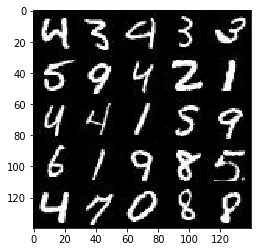

In [43]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

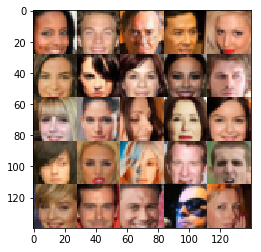

In [44]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [45]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf


# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [46]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(dtype=tf.float32, 
                                      shape=[None, image_width, image_height, image_channels],
                                      name="input_real")
  
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [47]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """    
    def leaky_relu(x, alpha=0.1):
        return tf.maximum(alpha * x, x)
    
    keep_prob = 0.9
    
    with tf.variable_scope("discriminator", reuse=reuse):
#         print(images)

        conv1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        conv1 = leaky_relu(conv1)
#         print(conv1)
        
        conv2 = tf.layers.conv2d(conv1, 128, 5, strides=2, padding='same')
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = leaky_relu(conv2)
        conv2 = tf.nn.dropout(conv2, keep_prob=keep_prob)
#         print(conv2)
        
        conv3 = tf.layers.conv2d(conv2, 256, 5, strides=2, padding='same')
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = leaky_relu(conv3)
        conv3 = tf.nn.dropout(conv3, keep_prob=keep_prob)
        
#         print(conv3)
        
        flat = tf.reshape(conv3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [48]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    def leaky_relu(x, alpha=0.1):
        return tf.maximum(alpha * x, x)
    
    keep_prob = 0.9
    
    with tf.variable_scope("generator", reuse=not(is_train)):

        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = leaky_relu(x1)
        x1 = tf.nn.dropout(x1, keep_prob=keep_prob)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 3, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = leaky_relu(x2)
        x2 = tf.nn.dropout(x2, keep_prob=keep_prob)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 3, strides=1, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = leaky_relu(x3)
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        
        x4 = tf.layers.conv2d_transpose(x3, 64, 3, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = leaky_relu(x4)
        
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 3, strides=2, padding='same')
        output = tf.tanh(logits)
        
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [49]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    gen_model = generator(input_z, out_channel_dim)
    
    disc_model_real, disc_logits_real = discriminator(input_real)
    disc_model_fake, disc_logits_fake = discriminator(gen_model, reuse=True)
    
    disc_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=disc_logits_real,
                                                labels=tf.ones_like(disc_model_real)))
    disc_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=disc_logits_fake,
                                                labels=tf.zeros_like(disc_model_fake)))
    gen_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=disc_logits_fake,
                                                labels=tf.ones_like(disc_model_fake)))
    disc_loss = disc_loss_real + disc_loss_fake
    
    return disc_loss, gen_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [50]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    train_vars = tf.trainable_variables()
    disc_vars = [var for var in train_vars if var.name.startswith('discriminator')]
    gen_vars = [var for var in train_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        disc_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=disc_vars)
        gen_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=gen_vars)
    
    return disc_train_opt, gen_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [51]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [52]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """    
    steps = 0
    out_channel_dim = data_shape[3]
    
    input_real, input_z, lr = model_inputs(*data_shape[1:], z_dim)
    
    disc_loss, gen_loss = model_loss(input_real, input_z, out_channel_dim)
    
    disc_train_opt, gen_train_opt = model_opt(disc_loss, gen_loss, learning_rate, beta1)

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images * 2
                
                _ = sess.run(disc_train_opt, feed_dict={input_real: batch_images,
                                                        input_z: batch_z,
                                                        lr: learning_rate})
                _ = sess.run(gen_train_opt, feed_dict={input_real: batch_images,
                                                       input_z: batch_z,
                                                       lr: learning_rate})
                
                if steps % 10 == 0:
                    train_loss_disc = disc_loss.eval({input_z: batch_z,
                                                      input_real: batch_images})
                    train_loss_gen = gen_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_disc),
                          "Generator Loss: {:.4f}".format(train_loss_gen))
                
                if steps % 100 == 0:
                    show_generator_output(sess, batch_size, input_z, 
                                          out_channel_dim, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.1553... Generator Loss: 2.4079
Epoch 1/2... Discriminator Loss: 0.1039... Generator Loss: 2.9317
Epoch 1/2... Discriminator Loss: 0.1522... Generator Loss: 3.7379
Epoch 1/2... Discriminator Loss: 0.4417... Generator Loss: 4.3194
Epoch 1/2... Discriminator Loss: 0.2215... Generator Loss: 2.2763
Epoch 1/2... Discriminator Loss: 0.1640... Generator Loss: 2.9804
Epoch 1/2... Discriminator Loss: 7.1882... Generator Loss: 15.7233
Epoch 1/2... Discriminator Loss: 1.0381... Generator Loss: 4.4123
Epoch 1/2... Discriminator Loss: 0.5542... Generator Loss: 1.4019
Epoch 1/2... Discriminator Loss: 0.3522... Generator Loss: 2.1515


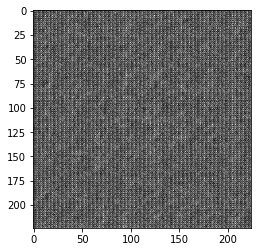

Epoch 1/2... Discriminator Loss: 0.4119... Generator Loss: 1.7907
Epoch 1/2... Discriminator Loss: 0.4151... Generator Loss: 3.0816
Epoch 1/2... Discriminator Loss: 1.1537... Generator Loss: 0.5840
Epoch 1/2... Discriminator Loss: 0.9145... Generator Loss: 0.6757
Epoch 1/2... Discriminator Loss: 0.4618... Generator Loss: 1.9639
Epoch 1/2... Discriminator Loss: 3.2647... Generator Loss: 0.0649
Epoch 1/2... Discriminator Loss: 0.7645... Generator Loss: 0.7042
Epoch 1/2... Discriminator Loss: 0.4679... Generator Loss: 1.5010
Epoch 1/2... Discriminator Loss: 3.7769... Generator Loss: 0.0380
Epoch 1/2... Discriminator Loss: 0.4553... Generator Loss: 1.3615


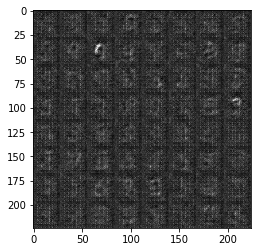

Epoch 1/2... Discriminator Loss: 2.3179... Generator Loss: 0.1615
Epoch 1/2... Discriminator Loss: 0.3847... Generator Loss: 1.7162
Epoch 1/2... Discriminator Loss: 1.1090... Generator Loss: 5.0300
Epoch 1/2... Discriminator Loss: 0.3475... Generator Loss: 2.5470
Epoch 1/2... Discriminator Loss: 0.2944... Generator Loss: 2.2093
Epoch 1/2... Discriminator Loss: 0.5872... Generator Loss: 3.9891
Epoch 1/2... Discriminator Loss: 0.3512... Generator Loss: 1.5221
Epoch 1/2... Discriminator Loss: 0.4536... Generator Loss: 2.6625
Epoch 1/2... Discriminator Loss: 0.3871... Generator Loss: 1.6962
Epoch 1/2... Discriminator Loss: 1.3128... Generator Loss: 0.4963


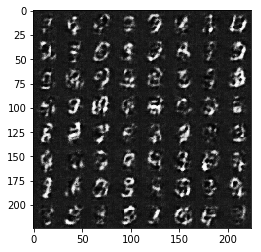

Epoch 1/2... Discriminator Loss: 0.5382... Generator Loss: 1.2909
Epoch 1/2... Discriminator Loss: 2.6737... Generator Loss: 0.1472
Epoch 1/2... Discriminator Loss: 0.4931... Generator Loss: 2.7202
Epoch 1/2... Discriminator Loss: 1.7081... Generator Loss: 0.2580
Epoch 1/2... Discriminator Loss: 0.5064... Generator Loss: 1.4343
Epoch 1/2... Discriminator Loss: 0.4655... Generator Loss: 1.1628
Epoch 1/2... Discriminator Loss: 0.6582... Generator Loss: 1.3951
Epoch 1/2... Discriminator Loss: 0.5815... Generator Loss: 1.2559
Epoch 1/2... Discriminator Loss: 1.0876... Generator Loss: 3.7180
Epoch 1/2... Discriminator Loss: 0.4855... Generator Loss: 1.4958


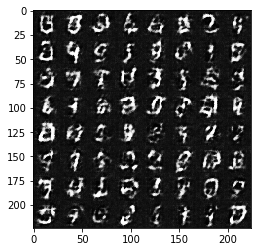

Epoch 1/2... Discriminator Loss: 0.4154... Generator Loss: 2.0901
Epoch 1/2... Discriminator Loss: 0.6606... Generator Loss: 3.4513
Epoch 1/2... Discriminator Loss: 1.0445... Generator Loss: 0.5786
Epoch 1/2... Discriminator Loss: 0.5260... Generator Loss: 1.5790
Epoch 1/2... Discriminator Loss: 1.4434... Generator Loss: 4.5287
Epoch 1/2... Discriminator Loss: 0.4741... Generator Loss: 1.6350
Epoch 1/2... Discriminator Loss: 1.8300... Generator Loss: 4.8833
Epoch 1/2... Discriminator Loss: 0.5046... Generator Loss: 1.9847
Epoch 1/2... Discriminator Loss: 0.9975... Generator Loss: 0.5593
Epoch 1/2... Discriminator Loss: 0.8402... Generator Loss: 0.8640


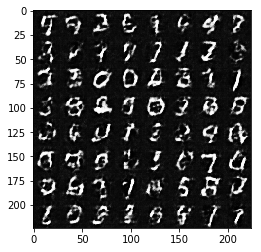

Epoch 1/2... Discriminator Loss: 1.4016... Generator Loss: 0.3890
Epoch 1/2... Discriminator Loss: 0.5611... Generator Loss: 1.9138
Epoch 1/2... Discriminator Loss: 0.6528... Generator Loss: 1.6568
Epoch 1/2... Discriminator Loss: 0.6998... Generator Loss: 1.0510
Epoch 1/2... Discriminator Loss: 1.7562... Generator Loss: 0.2813
Epoch 1/2... Discriminator Loss: 0.6014... Generator Loss: 1.1827
Epoch 1/2... Discriminator Loss: 0.6206... Generator Loss: 2.6361
Epoch 1/2... Discriminator Loss: 0.9053... Generator Loss: 3.0246
Epoch 1/2... Discriminator Loss: 0.7008... Generator Loss: 1.2846
Epoch 1/2... Discriminator Loss: 1.0464... Generator Loss: 0.5310


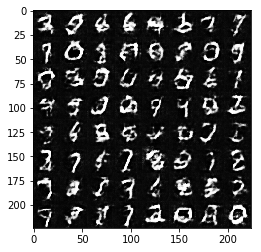

Epoch 1/2... Discriminator Loss: 0.8539... Generator Loss: 0.7916
Epoch 1/2... Discriminator Loss: 0.6046... Generator Loss: 1.8554
Epoch 1/2... Discriminator Loss: 0.7760... Generator Loss: 1.1816
Epoch 1/2... Discriminator Loss: 0.6372... Generator Loss: 1.5491
Epoch 1/2... Discriminator Loss: 1.0378... Generator Loss: 0.5807
Epoch 1/2... Discriminator Loss: 0.6963... Generator Loss: 1.4574
Epoch 1/2... Discriminator Loss: 0.8344... Generator Loss: 1.9398
Epoch 1/2... Discriminator Loss: 0.7451... Generator Loss: 1.0132
Epoch 1/2... Discriminator Loss: 1.6254... Generator Loss: 0.3604
Epoch 1/2... Discriminator Loss: 0.7106... Generator Loss: 1.4256


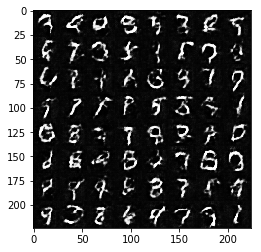

Epoch 1/2... Discriminator Loss: 0.8000... Generator Loss: 1.3187
Epoch 1/2... Discriminator Loss: 0.9457... Generator Loss: 0.5858
Epoch 1/2... Discriminator Loss: 0.9119... Generator Loss: 0.7700
Epoch 1/2... Discriminator Loss: 1.5314... Generator Loss: 0.3619
Epoch 1/2... Discriminator Loss: 0.9375... Generator Loss: 0.7662
Epoch 1/2... Discriminator Loss: 0.6708... Generator Loss: 1.1211
Epoch 1/2... Discriminator Loss: 0.7319... Generator Loss: 1.1077
Epoch 1/2... Discriminator Loss: 1.5011... Generator Loss: 3.0734
Epoch 1/2... Discriminator Loss: 0.7336... Generator Loss: 1.2032
Epoch 1/2... Discriminator Loss: 0.8377... Generator Loss: 2.0810


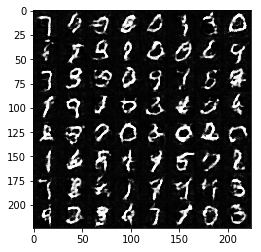

Epoch 1/2... Discriminator Loss: 0.6934... Generator Loss: 1.7073
Epoch 1/2... Discriminator Loss: 0.8646... Generator Loss: 1.1926
Epoch 1/2... Discriminator Loss: 0.9845... Generator Loss: 1.6458
Epoch 1/2... Discriminator Loss: 1.0331... Generator Loss: 0.6921
Epoch 1/2... Discriminator Loss: 1.5776... Generator Loss: 0.3291
Epoch 1/2... Discriminator Loss: 1.0840... Generator Loss: 0.6101
Epoch 1/2... Discriminator Loss: 0.8515... Generator Loss: 0.7690
Epoch 1/2... Discriminator Loss: 0.7932... Generator Loss: 1.3392
Epoch 1/2... Discriminator Loss: 0.7918... Generator Loss: 1.2472
Epoch 1/2... Discriminator Loss: 0.7237... Generator Loss: 0.9228


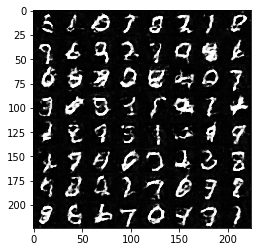

Epoch 1/2... Discriminator Loss: 4.5631... Generator Loss: 3.8650
Epoch 1/2... Discriminator Loss: 0.9836... Generator Loss: 1.1654
Epoch 1/2... Discriminator Loss: 0.8284... Generator Loss: 1.0113
Epoch 2/2... Discriminator Loss: 0.7448... Generator Loss: 1.6761
Epoch 2/2... Discriminator Loss: 0.7333... Generator Loss: 1.7836
Epoch 2/2... Discriminator Loss: 0.8017... Generator Loss: 1.8583
Epoch 2/2... Discriminator Loss: 1.0650... Generator Loss: 0.6724
Epoch 2/2... Discriminator Loss: 1.3335... Generator Loss: 0.5088
Epoch 2/2... Discriminator Loss: 0.9084... Generator Loss: 0.8362
Epoch 2/2... Discriminator Loss: 1.5353... Generator Loss: 0.3663


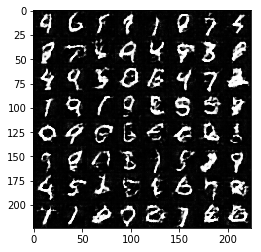

Epoch 2/2... Discriminator Loss: 1.4273... Generator Loss: 0.4889
Epoch 2/2... Discriminator Loss: 0.6937... Generator Loss: 1.6780
Epoch 2/2... Discriminator Loss: 0.9101... Generator Loss: 0.7204
Epoch 2/2... Discriminator Loss: 0.6631... Generator Loss: 1.3429
Epoch 2/2... Discriminator Loss: 0.8115... Generator Loss: 1.4859
Epoch 2/2... Discriminator Loss: 0.7404... Generator Loss: 1.3315
Epoch 2/2... Discriminator Loss: 0.8050... Generator Loss: 1.1463
Epoch 2/2... Discriminator Loss: 0.8450... Generator Loss: 1.6521
Epoch 2/2... Discriminator Loss: 0.8265... Generator Loss: 0.9682
Epoch 2/2... Discriminator Loss: 1.0157... Generator Loss: 0.7727


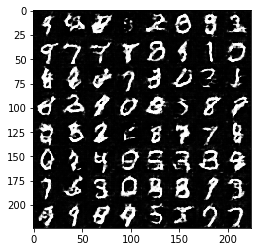

Epoch 2/2... Discriminator Loss: 0.7529... Generator Loss: 1.4878
Epoch 2/2... Discriminator Loss: 0.7773... Generator Loss: 1.1109
Epoch 2/2... Discriminator Loss: 0.8147... Generator Loss: 0.9533
Epoch 2/2... Discriminator Loss: 0.6959... Generator Loss: 1.3414
Epoch 2/2... Discriminator Loss: 0.7943... Generator Loss: 1.1787
Epoch 2/2... Discriminator Loss: 0.7907... Generator Loss: 1.0533
Epoch 2/2... Discriminator Loss: 0.9102... Generator Loss: 0.8996
Epoch 2/2... Discriminator Loss: 0.8991... Generator Loss: 0.7499
Epoch 2/2... Discriminator Loss: 1.2303... Generator Loss: 0.6466
Epoch 2/2... Discriminator Loss: 1.0044... Generator Loss: 0.7117


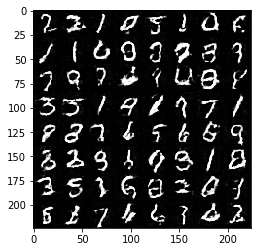

Epoch 2/2... Discriminator Loss: 0.6430... Generator Loss: 1.8416
Epoch 2/2... Discriminator Loss: 0.7350... Generator Loss: 1.1567
Epoch 2/2... Discriminator Loss: 0.8054... Generator Loss: 1.0607
Epoch 2/2... Discriminator Loss: 0.8660... Generator Loss: 1.9108
Epoch 2/2... Discriminator Loss: 0.6854... Generator Loss: 1.3259
Epoch 2/2... Discriminator Loss: 0.7880... Generator Loss: 1.1012
Epoch 2/2... Discriminator Loss: 0.6995... Generator Loss: 1.3229
Epoch 2/2... Discriminator Loss: 0.9232... Generator Loss: 0.6717
Epoch 2/2... Discriminator Loss: 0.8597... Generator Loss: 0.7459
Epoch 2/2... Discriminator Loss: 1.4224... Generator Loss: 0.3091


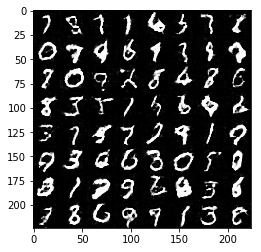

Epoch 2/2... Discriminator Loss: 0.8106... Generator Loss: 1.0327
Epoch 2/2... Discriminator Loss: 0.6033... Generator Loss: 1.5129
Epoch 2/2... Discriminator Loss: 0.7768... Generator Loss: 1.4421
Epoch 2/2... Discriminator Loss: 1.4073... Generator Loss: 0.4732
Epoch 2/2... Discriminator Loss: 0.6864... Generator Loss: 1.3845
Epoch 2/2... Discriminator Loss: 1.0680... Generator Loss: 0.7060
Epoch 2/2... Discriminator Loss: 1.0393... Generator Loss: 0.6056
Epoch 2/2... Discriminator Loss: 0.6749... Generator Loss: 1.4516
Epoch 2/2... Discriminator Loss: 0.7952... Generator Loss: 1.0242
Epoch 2/2... Discriminator Loss: 0.7927... Generator Loss: 1.7794


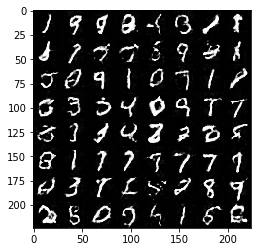

Epoch 2/2... Discriminator Loss: 0.7799... Generator Loss: 2.0050
Epoch 2/2... Discriminator Loss: 0.8754... Generator Loss: 0.8641
Epoch 2/2... Discriminator Loss: 0.7682... Generator Loss: 1.2488
Epoch 2/2... Discriminator Loss: 0.6022... Generator Loss: 1.6636
Epoch 2/2... Discriminator Loss: 0.6806... Generator Loss: 1.3954
Epoch 2/2... Discriminator Loss: 0.6182... Generator Loss: 1.2512
Epoch 2/2... Discriminator Loss: 1.2338... Generator Loss: 2.7864
Epoch 2/2... Discriminator Loss: 0.8276... Generator Loss: 0.8738
Epoch 2/2... Discriminator Loss: 0.9861... Generator Loss: 1.2993
Epoch 2/2... Discriminator Loss: 0.9244... Generator Loss: 1.0584


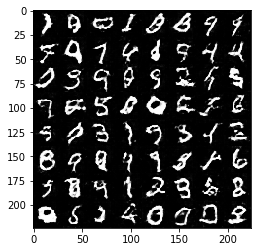

Epoch 2/2... Discriminator Loss: 0.6752... Generator Loss: 1.6715
Epoch 2/2... Discriminator Loss: 0.7823... Generator Loss: 1.0168
Epoch 2/2... Discriminator Loss: 0.8116... Generator Loss: 1.6599
Epoch 2/2... Discriminator Loss: 1.8083... Generator Loss: 3.2722
Epoch 2/2... Discriminator Loss: 0.7498... Generator Loss: 1.3932
Epoch 2/2... Discriminator Loss: 0.8085... Generator Loss: 1.2980
Epoch 2/2... Discriminator Loss: 0.6849... Generator Loss: 1.1783
Epoch 2/2... Discriminator Loss: 0.7209... Generator Loss: 1.0323
Epoch 2/2... Discriminator Loss: 1.2361... Generator Loss: 0.5714
Epoch 2/2... Discriminator Loss: 0.7209... Generator Loss: 1.1213


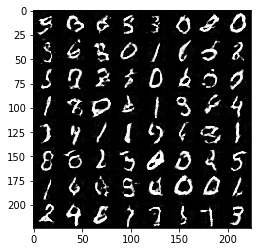

Epoch 2/2... Discriminator Loss: 0.7143... Generator Loss: 1.7464
Epoch 2/2... Discriminator Loss: 0.7943... Generator Loss: 0.7629
Epoch 2/2... Discriminator Loss: 0.7631... Generator Loss: 1.1174
Epoch 2/2... Discriminator Loss: 0.6181... Generator Loss: 1.2718
Epoch 2/2... Discriminator Loss: 0.9268... Generator Loss: 0.9347
Epoch 2/2... Discriminator Loss: 2.0169... Generator Loss: 0.2824
Epoch 2/2... Discriminator Loss: 0.7417... Generator Loss: 1.1744
Epoch 2/2... Discriminator Loss: 0.7118... Generator Loss: 1.1938
Epoch 2/2... Discriminator Loss: 0.5789... Generator Loss: 1.4834
Epoch 2/2... Discriminator Loss: 0.8267... Generator Loss: 0.7518


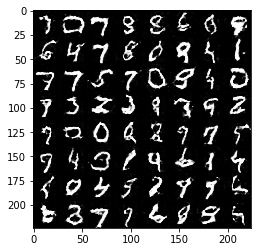

Epoch 2/2... Discriminator Loss: 0.6585... Generator Loss: 1.0151
Epoch 2/2... Discriminator Loss: 0.9062... Generator Loss: 2.0945
Epoch 2/2... Discriminator Loss: 0.6790... Generator Loss: 1.3201
Epoch 2/2... Discriminator Loss: 0.9523... Generator Loss: 0.8195
Epoch 2/2... Discriminator Loss: 0.9365... Generator Loss: 0.8529
Epoch 2/2... Discriminator Loss: 0.8091... Generator Loss: 1.1857
Epoch 2/2... Discriminator Loss: 0.8724... Generator Loss: 0.8641
Epoch 2/2... Discriminator Loss: 1.1453... Generator Loss: 0.6511
Epoch 2/2... Discriminator Loss: 0.9013... Generator Loss: 0.7540
Epoch 2/2... Discriminator Loss: 0.7671... Generator Loss: 1.7703


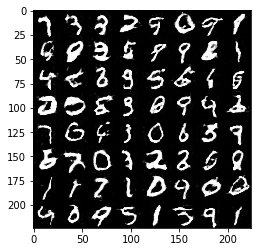

Epoch 2/2... Discriminator Loss: 1.0088... Generator Loss: 0.7582
Epoch 2/2... Discriminator Loss: 0.7207... Generator Loss: 1.4209
Epoch 2/2... Discriminator Loss: 0.7859... Generator Loss: 1.0571
Epoch 2/2... Discriminator Loss: 0.6421... Generator Loss: 1.3592
Epoch 2/2... Discriminator Loss: 1.0804... Generator Loss: 1.6745
Epoch 2/2... Discriminator Loss: 0.6584... Generator Loss: 1.2277
Epoch 2/2... Discriminator Loss: 0.6398... Generator Loss: 1.3944


In [53]:
batch_size = 64
z_dim = 128
learning_rate = .0002
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/3... Discriminator Loss: 2.4218... Generator Loss: 0.1727
Epoch 1/3... Discriminator Loss: 6.5259... Generator Loss: 0.0028
Epoch 1/3... Discriminator Loss: 2.5395... Generator Loss: 0.1085
Epoch 1/3... Discriminator Loss: 2.3891... Generator Loss: 0.1244
Epoch 1/3... Discriminator Loss: 2.3961... Generator Loss: 0.1402
Epoch 1/3... Discriminator Loss: 0.8728... Generator Loss: 2.1143
Epoch 1/3... Discriminator Loss: 0.8164... Generator Loss: 2.6412
Epoch 1/3... Discriminator Loss: 1.2368... Generator Loss: 0.5510
Epoch 1/3... Discriminator Loss: 1.9282... Generator Loss: 4.9533
Epoch 1/3... Discriminator Loss: 1.8662... Generator Loss: 0.2274


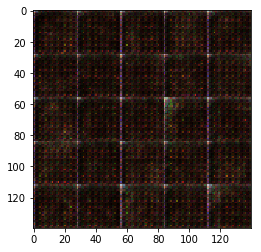

Epoch 1/3... Discriminator Loss: 1.0516... Generator Loss: 0.5757
Epoch 1/3... Discriminator Loss: 1.2804... Generator Loss: 2.8709
Epoch 1/3... Discriminator Loss: 1.1041... Generator Loss: 0.5269
Epoch 1/3... Discriminator Loss: 1.1492... Generator Loss: 0.6023
Epoch 1/3... Discriminator Loss: 2.8214... Generator Loss: 0.0929
Epoch 1/3... Discriminator Loss: 1.5253... Generator Loss: 0.3484
Epoch 1/3... Discriminator Loss: 1.8810... Generator Loss: 0.2101
Epoch 1/3... Discriminator Loss: 1.4900... Generator Loss: 0.3168
Epoch 1/3... Discriminator Loss: 1.0841... Generator Loss: 0.7673
Epoch 1/3... Discriminator Loss: 1.6457... Generator Loss: 0.2715


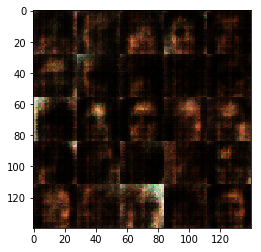

Epoch 1/3... Discriminator Loss: 2.5166... Generator Loss: 0.1098
Epoch 1/3... Discriminator Loss: 1.9678... Generator Loss: 0.2243
Epoch 1/3... Discriminator Loss: 1.4869... Generator Loss: 2.3590
Epoch 1/3... Discriminator Loss: 0.8102... Generator Loss: 1.0899
Epoch 1/3... Discriminator Loss: 1.5442... Generator Loss: 1.7682
Epoch 1/3... Discriminator Loss: 1.4669... Generator Loss: 0.6370
Epoch 1/3... Discriminator Loss: 1.3494... Generator Loss: 0.7753
Epoch 1/3... Discriminator Loss: 1.5268... Generator Loss: 1.2192
Epoch 1/3... Discriminator Loss: 1.2722... Generator Loss: 0.8930
Epoch 1/3... Discriminator Loss: 1.4832... Generator Loss: 0.7783


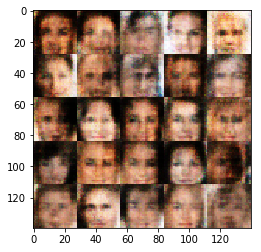

Epoch 1/3... Discriminator Loss: 1.2803... Generator Loss: 0.6042
Epoch 1/3... Discriminator Loss: 1.2326... Generator Loss: 1.2308
Epoch 1/3... Discriminator Loss: 1.1780... Generator Loss: 1.3442
Epoch 1/3... Discriminator Loss: 1.5009... Generator Loss: 1.5152
Epoch 1/3... Discriminator Loss: 1.0514... Generator Loss: 0.7643
Epoch 1/3... Discriminator Loss: 1.6102... Generator Loss: 0.3260
Epoch 1/3... Discriminator Loss: 1.3937... Generator Loss: 1.6183
Epoch 1/3... Discriminator Loss: 1.1822... Generator Loss: 1.1934
Epoch 1/3... Discriminator Loss: 1.6907... Generator Loss: 0.3864
Epoch 1/3... Discriminator Loss: 0.9411... Generator Loss: 0.8672


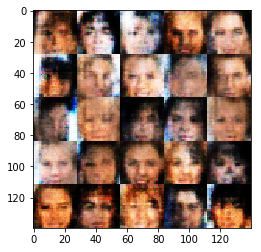

Epoch 1/3... Discriminator Loss: 1.3630... Generator Loss: 1.2496
Epoch 1/3... Discriminator Loss: 1.2582... Generator Loss: 1.4823
Epoch 1/3... Discriminator Loss: 2.1049... Generator Loss: 0.1586
Epoch 1/3... Discriminator Loss: 1.7829... Generator Loss: 0.2276
Epoch 1/3... Discriminator Loss: 1.8983... Generator Loss: 0.2482
Epoch 1/3... Discriminator Loss: 1.3386... Generator Loss: 0.4770
Epoch 1/3... Discriminator Loss: 1.7653... Generator Loss: 0.2283
Epoch 1/3... Discriminator Loss: 1.5932... Generator Loss: 0.2846
Epoch 1/3... Discriminator Loss: 1.5818... Generator Loss: 1.8936
Epoch 1/3... Discriminator Loss: 1.2553... Generator Loss: 0.7512


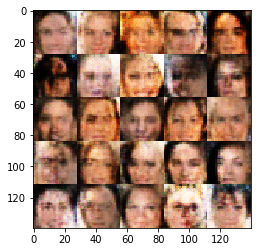

Epoch 1/3... Discriminator Loss: 1.1411... Generator Loss: 0.5655
Epoch 1/3... Discriminator Loss: 1.2201... Generator Loss: 0.6867
Epoch 1/3... Discriminator Loss: 1.2233... Generator Loss: 1.1527
Epoch 1/3... Discriminator Loss: 1.0433... Generator Loss: 1.0653
Epoch 1/3... Discriminator Loss: 1.2331... Generator Loss: 0.6642
Epoch 1/3... Discriminator Loss: 1.3224... Generator Loss: 1.1619
Epoch 1/3... Discriminator Loss: 1.2193... Generator Loss: 0.4277
Epoch 1/3... Discriminator Loss: 1.2057... Generator Loss: 0.5260
Epoch 1/3... Discriminator Loss: 1.3523... Generator Loss: 1.2966
Epoch 1/3... Discriminator Loss: 1.1173... Generator Loss: 1.3447


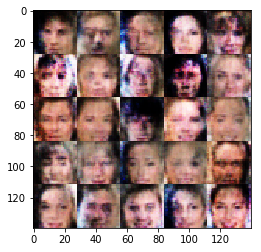

Epoch 1/3... Discriminator Loss: 1.4248... Generator Loss: 0.6776
Epoch 1/3... Discriminator Loss: 1.2435... Generator Loss: 0.6180
Epoch 1/3... Discriminator Loss: 1.5141... Generator Loss: 1.7171
Epoch 1/3... Discriminator Loss: 1.2862... Generator Loss: 1.5947
Epoch 1/3... Discriminator Loss: 1.4776... Generator Loss: 1.1620
Epoch 1/3... Discriminator Loss: 1.0918... Generator Loss: 1.1299
Epoch 1/3... Discriminator Loss: 1.1432... Generator Loss: 0.5494
Epoch 1/3... Discriminator Loss: 1.8354... Generator Loss: 0.2563
Epoch 1/3... Discriminator Loss: 1.6651... Generator Loss: 0.2855
Epoch 1/3... Discriminator Loss: 1.2566... Generator Loss: 0.8258


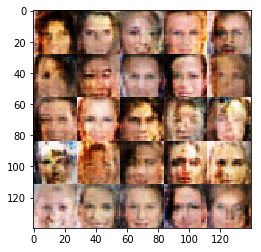

Epoch 1/3... Discriminator Loss: 1.3432... Generator Loss: 0.8497
Epoch 1/3... Discriminator Loss: 1.2505... Generator Loss: 1.1087
Epoch 1/3... Discriminator Loss: 1.3588... Generator Loss: 0.5844
Epoch 1/3... Discriminator Loss: 1.9516... Generator Loss: 0.1692
Epoch 1/3... Discriminator Loss: 1.1801... Generator Loss: 0.6564
Epoch 1/3... Discriminator Loss: 1.1489... Generator Loss: 0.5896
Epoch 1/3... Discriminator Loss: 1.6707... Generator Loss: 0.2900
Epoch 1/3... Discriminator Loss: 1.9026... Generator Loss: 0.1888
Epoch 1/3... Discriminator Loss: 1.2650... Generator Loss: 0.9152
Epoch 1/3... Discriminator Loss: 1.2764... Generator Loss: 0.4480


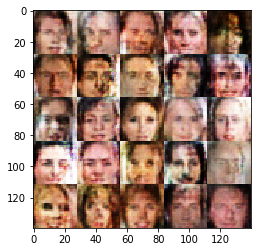

Epoch 1/3... Discriminator Loss: 1.3547... Generator Loss: 1.1537
Epoch 1/3... Discriminator Loss: 1.0764... Generator Loss: 0.6756
Epoch 1/3... Discriminator Loss: 1.1964... Generator Loss: 1.0598
Epoch 1/3... Discriminator Loss: 1.1020... Generator Loss: 0.8086
Epoch 1/3... Discriminator Loss: 1.3251... Generator Loss: 0.7423
Epoch 1/3... Discriminator Loss: 1.1661... Generator Loss: 0.5944
Epoch 1/3... Discriminator Loss: 1.3834... Generator Loss: 0.5856
Epoch 1/3... Discriminator Loss: 1.0957... Generator Loss: 0.6192
Epoch 1/3... Discriminator Loss: 1.4485... Generator Loss: 0.3970
Epoch 1/3... Discriminator Loss: 1.4465... Generator Loss: 0.3651


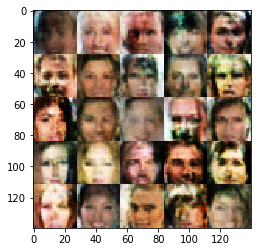

Epoch 1/3... Discriminator Loss: 1.8788... Generator Loss: 2.2072
Epoch 1/3... Discriminator Loss: 1.2792... Generator Loss: 0.4565
Epoch 1/3... Discriminator Loss: 1.0716... Generator Loss: 1.3405
Epoch 1/3... Discriminator Loss: 1.4475... Generator Loss: 0.2958
Epoch 1/3... Discriminator Loss: 2.2771... Generator Loss: 0.1385
Epoch 1/3... Discriminator Loss: 1.4059... Generator Loss: 0.4568
Epoch 1/3... Discriminator Loss: 1.5687... Generator Loss: 0.3037
Epoch 1/3... Discriminator Loss: 1.7513... Generator Loss: 2.1030
Epoch 1/3... Discriminator Loss: 1.0882... Generator Loss: 0.6436
Epoch 1/3... Discriminator Loss: 1.3680... Generator Loss: 0.4676


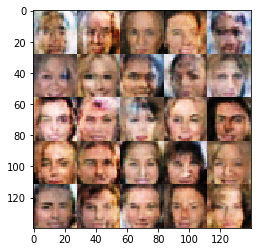

Epoch 1/3... Discriminator Loss: 1.0985... Generator Loss: 0.5847
Epoch 1/3... Discriminator Loss: 1.3287... Generator Loss: 0.6476
Epoch 1/3... Discriminator Loss: 1.4807... Generator Loss: 0.4397
Epoch 1/3... Discriminator Loss: 1.0882... Generator Loss: 0.7390
Epoch 1/3... Discriminator Loss: 1.3284... Generator Loss: 0.5083
Epoch 1/3... Discriminator Loss: 1.1130... Generator Loss: 0.7746
Epoch 1/3... Discriminator Loss: 1.1652... Generator Loss: 0.9312
Epoch 1/3... Discriminator Loss: 1.2488... Generator Loss: 0.8352
Epoch 1/3... Discriminator Loss: 1.3850... Generator Loss: 1.1202
Epoch 1/3... Discriminator Loss: 1.0837... Generator Loss: 0.8414


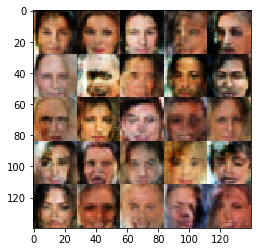

Epoch 1/3... Discriminator Loss: 1.3572... Generator Loss: 0.9779
Epoch 1/3... Discriminator Loss: 1.3176... Generator Loss: 0.6407
Epoch 1/3... Discriminator Loss: 1.2852... Generator Loss: 0.4782
Epoch 1/3... Discriminator Loss: 1.1460... Generator Loss: 0.6441
Epoch 1/3... Discriminator Loss: 1.9311... Generator Loss: 0.2095
Epoch 1/3... Discriminator Loss: 1.4407... Generator Loss: 0.9124
Epoch 1/3... Discriminator Loss: 1.3751... Generator Loss: 1.1781
Epoch 1/3... Discriminator Loss: 1.1897... Generator Loss: 0.9696
Epoch 1/3... Discriminator Loss: 1.4447... Generator Loss: 0.3659
Epoch 1/3... Discriminator Loss: 1.2561... Generator Loss: 0.7442


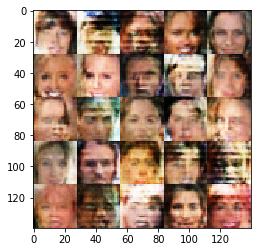

Epoch 1/3... Discriminator Loss: 1.2433... Generator Loss: 0.5589
Epoch 1/3... Discriminator Loss: 1.3201... Generator Loss: 0.4430
Epoch 1/3... Discriminator Loss: 1.1263... Generator Loss: 0.6919
Epoch 1/3... Discriminator Loss: 1.4820... Generator Loss: 1.7034
Epoch 1/3... Discriminator Loss: 1.1846... Generator Loss: 0.9491
Epoch 1/3... Discriminator Loss: 1.5635... Generator Loss: 0.2714
Epoch 1/3... Discriminator Loss: 1.4731... Generator Loss: 0.3147
Epoch 1/3... Discriminator Loss: 1.2202... Generator Loss: 0.7193
Epoch 1/3... Discriminator Loss: 1.4485... Generator Loss: 0.3803
Epoch 1/3... Discriminator Loss: 1.1655... Generator Loss: 0.6208


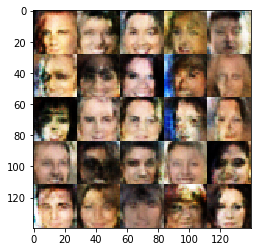

Epoch 1/3... Discriminator Loss: 1.3659... Generator Loss: 0.3591
Epoch 1/3... Discriminator Loss: 1.2688... Generator Loss: 0.6554
Epoch 1/3... Discriminator Loss: 1.1407... Generator Loss: 1.1120
Epoch 1/3... Discriminator Loss: 1.3947... Generator Loss: 0.4130
Epoch 1/3... Discriminator Loss: 1.7378... Generator Loss: 0.2939
Epoch 1/3... Discriminator Loss: 1.0009... Generator Loss: 0.7033
Epoch 1/3... Discriminator Loss: 1.4952... Generator Loss: 0.3113
Epoch 1/3... Discriminator Loss: 1.3731... Generator Loss: 0.7115
Epoch 1/3... Discriminator Loss: 1.0086... Generator Loss: 0.9317
Epoch 1/3... Discriminator Loss: 1.4959... Generator Loss: 0.2878


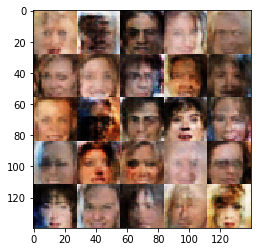

Epoch 1/3... Discriminator Loss: 1.6086... Generator Loss: 0.3173
Epoch 1/3... Discriminator Loss: 1.3177... Generator Loss: 0.5795
Epoch 1/3... Discriminator Loss: 1.1485... Generator Loss: 0.6112
Epoch 1/3... Discriminator Loss: 1.5328... Generator Loss: 0.2856
Epoch 1/3... Discriminator Loss: 1.5214... Generator Loss: 0.4053
Epoch 1/3... Discriminator Loss: 1.4365... Generator Loss: 0.3608
Epoch 1/3... Discriminator Loss: 1.5144... Generator Loss: 1.5582
Epoch 1/3... Discriminator Loss: 1.4640... Generator Loss: 0.6281
Epoch 1/3... Discriminator Loss: 1.6136... Generator Loss: 0.4760
Epoch 1/3... Discriminator Loss: 1.5389... Generator Loss: 0.3642


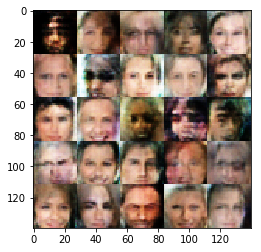

Epoch 1/3... Discriminator Loss: 1.4098... Generator Loss: 0.3372
Epoch 1/3... Discriminator Loss: 1.1855... Generator Loss: 0.9247
Epoch 1/3... Discriminator Loss: 1.1874... Generator Loss: 0.8087
Epoch 1/3... Discriminator Loss: 1.0368... Generator Loss: 1.1993
Epoch 1/3... Discriminator Loss: 1.7059... Generator Loss: 0.2630
Epoch 1/3... Discriminator Loss: 1.3061... Generator Loss: 0.3883
Epoch 1/3... Discriminator Loss: 1.4875... Generator Loss: 0.3269
Epoch 1/3... Discriminator Loss: 1.3814... Generator Loss: 0.3475
Epoch 1/3... Discriminator Loss: 1.0313... Generator Loss: 1.1480
Epoch 1/3... Discriminator Loss: 1.0601... Generator Loss: 1.3148


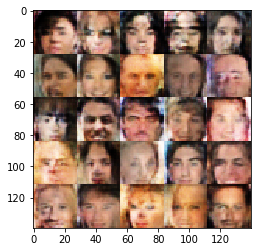

Epoch 1/3... Discriminator Loss: 1.4534... Generator Loss: 0.4154
Epoch 1/3... Discriminator Loss: 1.2330... Generator Loss: 0.5187
Epoch 1/3... Discriminator Loss: 1.7875... Generator Loss: 0.2514
Epoch 1/3... Discriminator Loss: 1.4674... Generator Loss: 0.3920
Epoch 1/3... Discriminator Loss: 1.8239... Generator Loss: 0.2790
Epoch 1/3... Discriminator Loss: 1.1118... Generator Loss: 0.6745
Epoch 1/3... Discriminator Loss: 1.3784... Generator Loss: 0.4293
Epoch 1/3... Discriminator Loss: 1.0022... Generator Loss: 0.9574
Epoch 1/3... Discriminator Loss: 1.6290... Generator Loss: 0.2690
Epoch 1/3... Discriminator Loss: 1.1466... Generator Loss: 0.7814


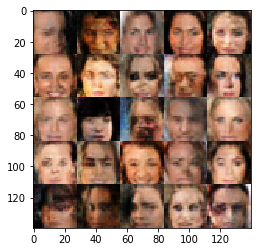

Epoch 1/3... Discriminator Loss: 1.0866... Generator Loss: 0.9939
Epoch 1/3... Discriminator Loss: 1.2290... Generator Loss: 0.5497
Epoch 1/3... Discriminator Loss: 1.2035... Generator Loss: 0.4872
Epoch 1/3... Discriminator Loss: 1.3677... Generator Loss: 0.3915
Epoch 1/3... Discriminator Loss: 1.3924... Generator Loss: 0.3678
Epoch 1/3... Discriminator Loss: 1.2923... Generator Loss: 0.7729
Epoch 1/3... Discriminator Loss: 1.7287... Generator Loss: 0.2924
Epoch 1/3... Discriminator Loss: 1.4257... Generator Loss: 0.3413
Epoch 1/3... Discriminator Loss: 1.4212... Generator Loss: 0.4395
Epoch 1/3... Discriminator Loss: 1.2891... Generator Loss: 1.4996


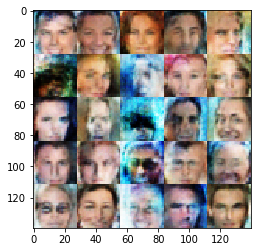

Epoch 1/3... Discriminator Loss: 1.1366... Generator Loss: 1.1280
Epoch 1/3... Discriminator Loss: 1.2164... Generator Loss: 1.0145
Epoch 1/3... Discriminator Loss: 1.1771... Generator Loss: 1.0304
Epoch 1/3... Discriminator Loss: 1.0899... Generator Loss: 0.6313
Epoch 1/3... Discriminator Loss: 1.1031... Generator Loss: 0.6349
Epoch 1/3... Discriminator Loss: 1.4086... Generator Loss: 0.3266
Epoch 1/3... Discriminator Loss: 1.8407... Generator Loss: 0.2681
Epoch 1/3... Discriminator Loss: 1.4816... Generator Loss: 0.2766
Epoch 1/3... Discriminator Loss: 1.2820... Generator Loss: 0.4820
Epoch 1/3... Discriminator Loss: 1.1512... Generator Loss: 1.0339


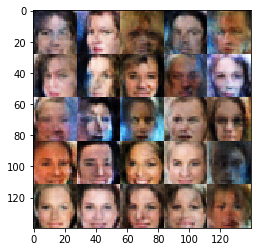

Epoch 1/3... Discriminator Loss: 1.1001... Generator Loss: 0.6715
Epoch 1/3... Discriminator Loss: 1.1920... Generator Loss: 0.5572
Epoch 1/3... Discriminator Loss: 1.1284... Generator Loss: 0.4825
Epoch 1/3... Discriminator Loss: 1.1657... Generator Loss: 0.8568
Epoch 1/3... Discriminator Loss: 1.2643... Generator Loss: 0.5035
Epoch 1/3... Discriminator Loss: 0.9966... Generator Loss: 0.7249
Epoch 1/3... Discriminator Loss: 1.3823... Generator Loss: 0.3959
Epoch 1/3... Discriminator Loss: 1.1177... Generator Loss: 0.6560
Epoch 1/3... Discriminator Loss: 1.5047... Generator Loss: 0.3898
Epoch 1/3... Discriminator Loss: 1.0276... Generator Loss: 0.9671


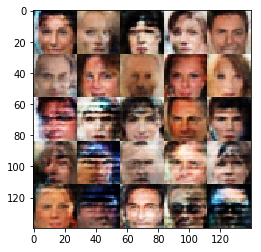

Epoch 1/3... Discriminator Loss: 1.3317... Generator Loss: 1.3107
Epoch 1/3... Discriminator Loss: 0.9619... Generator Loss: 0.9720
Epoch 1/3... Discriminator Loss: 1.5863... Generator Loss: 0.2914
Epoch 1/3... Discriminator Loss: 1.0544... Generator Loss: 1.3567
Epoch 1/3... Discriminator Loss: 1.0808... Generator Loss: 0.7972
Epoch 1/3... Discriminator Loss: 1.3944... Generator Loss: 0.3584
Epoch 1/3... Discriminator Loss: 1.1796... Generator Loss: 0.5096
Epoch 1/3... Discriminator Loss: 1.0603... Generator Loss: 0.5665
Epoch 1/3... Discriminator Loss: 0.9773... Generator Loss: 0.6065
Epoch 1/3... Discriminator Loss: 1.0738... Generator Loss: 0.6024


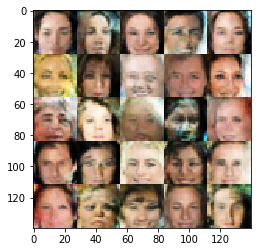

Epoch 1/3... Discriminator Loss: 1.0887... Generator Loss: 0.8188
Epoch 1/3... Discriminator Loss: 1.1605... Generator Loss: 0.6579
Epoch 1/3... Discriminator Loss: 1.8689... Generator Loss: 0.2172
Epoch 1/3... Discriminator Loss: 1.4578... Generator Loss: 0.3599
Epoch 1/3... Discriminator Loss: 1.6004... Generator Loss: 0.3220
Epoch 1/3... Discriminator Loss: 1.0882... Generator Loss: 0.8086
Epoch 1/3... Discriminator Loss: 1.6016... Generator Loss: 0.3059
Epoch 1/3... Discriminator Loss: 1.4493... Generator Loss: 0.3642
Epoch 1/3... Discriminator Loss: 1.2459... Generator Loss: 1.4749
Epoch 1/3... Discriminator Loss: 1.0541... Generator Loss: 0.7904


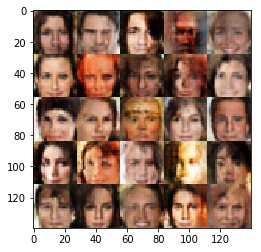

Epoch 1/3... Discriminator Loss: 1.0837... Generator Loss: 1.1592
Epoch 1/3... Discriminator Loss: 1.4612... Generator Loss: 0.4077
Epoch 1/3... Discriminator Loss: 1.1064... Generator Loss: 0.8005
Epoch 1/3... Discriminator Loss: 1.1775... Generator Loss: 1.0677
Epoch 1/3... Discriminator Loss: 1.0014... Generator Loss: 0.6929
Epoch 1/3... Discriminator Loss: 1.5500... Generator Loss: 0.3385
Epoch 1/3... Discriminator Loss: 0.9508... Generator Loss: 1.1559
Epoch 1/3... Discriminator Loss: 1.0212... Generator Loss: 0.8430
Epoch 1/3... Discriminator Loss: 0.9923... Generator Loss: 1.0804
Epoch 1/3... Discriminator Loss: 1.4430... Generator Loss: 0.4068


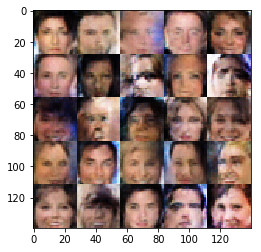

Epoch 1/3... Discriminator Loss: 1.1163... Generator Loss: 0.9145
Epoch 1/3... Discriminator Loss: 1.3574... Generator Loss: 0.4739
Epoch 1/3... Discriminator Loss: 1.2924... Generator Loss: 0.9454
Epoch 1/3... Discriminator Loss: 0.9197... Generator Loss: 0.8886
Epoch 1/3... Discriminator Loss: 1.5094... Generator Loss: 0.3740
Epoch 1/3... Discriminator Loss: 1.1110... Generator Loss: 0.9969
Epoch 1/3... Discriminator Loss: 1.3650... Generator Loss: 0.5436
Epoch 1/3... Discriminator Loss: 1.1285... Generator Loss: 0.6880
Epoch 1/3... Discriminator Loss: 1.7800... Generator Loss: 0.2957
Epoch 1/3... Discriminator Loss: 1.9247... Generator Loss: 0.2213


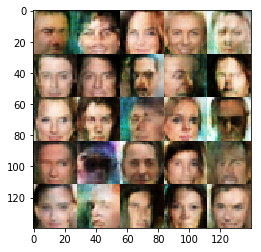

Epoch 1/3... Discriminator Loss: 1.3876... Generator Loss: 0.4031
Epoch 1/3... Discriminator Loss: 1.8420... Generator Loss: 0.2805
Epoch 1/3... Discriminator Loss: 1.1904... Generator Loss: 0.7413
Epoch 1/3... Discriminator Loss: 1.0178... Generator Loss: 1.0326
Epoch 1/3... Discriminator Loss: 1.2769... Generator Loss: 0.8253
Epoch 1/3... Discriminator Loss: 1.4260... Generator Loss: 0.3342
Epoch 1/3... Discriminator Loss: 1.2897... Generator Loss: 0.4964
Epoch 1/3... Discriminator Loss: 1.6140... Generator Loss: 0.4543
Epoch 1/3... Discriminator Loss: 1.0285... Generator Loss: 0.8432
Epoch 1/3... Discriminator Loss: 1.6938... Generator Loss: 0.2474


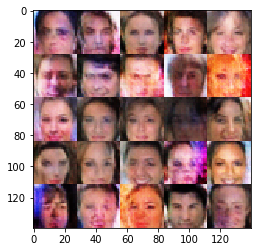

Epoch 1/3... Discriminator Loss: 1.4342... Generator Loss: 0.3520
Epoch 1/3... Discriminator Loss: 1.5395... Generator Loss: 0.2699
Epoch 1/3... Discriminator Loss: 1.1895... Generator Loss: 0.5182
Epoch 1/3... Discriminator Loss: 1.2422... Generator Loss: 0.5459
Epoch 1/3... Discriminator Loss: 1.0654... Generator Loss: 0.9488
Epoch 1/3... Discriminator Loss: 1.2151... Generator Loss: 0.7802
Epoch 1/3... Discriminator Loss: 1.1128... Generator Loss: 1.1245
Epoch 1/3... Discriminator Loss: 1.7942... Generator Loss: 1.6750
Epoch 1/3... Discriminator Loss: 1.4610... Generator Loss: 0.3344
Epoch 1/3... Discriminator Loss: 1.1821... Generator Loss: 0.8433


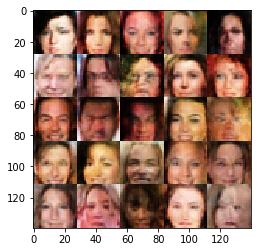

Epoch 1/3... Discriminator Loss: 1.2280... Generator Loss: 0.6999
Epoch 1/3... Discriminator Loss: 0.8839... Generator Loss: 1.3157
Epoch 1/3... Discriminator Loss: 1.3801... Generator Loss: 0.4168
Epoch 1/3... Discriminator Loss: 1.1941... Generator Loss: 0.5462
Epoch 1/3... Discriminator Loss: 1.5085... Generator Loss: 0.3889
Epoch 1/3... Discriminator Loss: 1.1352... Generator Loss: 0.7079
Epoch 1/3... Discriminator Loss: 1.4894... Generator Loss: 1.2058
Epoch 1/3... Discriminator Loss: 1.3515... Generator Loss: 0.4880
Epoch 1/3... Discriminator Loss: 1.2591... Generator Loss: 0.4696
Epoch 1/3... Discriminator Loss: 1.3714... Generator Loss: 0.4014


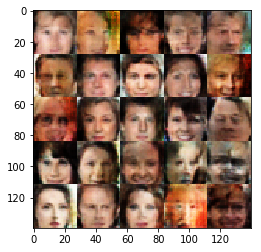

Epoch 1/3... Discriminator Loss: 1.5760... Generator Loss: 0.4538
Epoch 1/3... Discriminator Loss: 1.0552... Generator Loss: 1.0527
Epoch 1/3... Discriminator Loss: 1.0610... Generator Loss: 0.6259
Epoch 1/3... Discriminator Loss: 1.0374... Generator Loss: 0.8242
Epoch 1/3... Discriminator Loss: 0.9788... Generator Loss: 0.8546
Epoch 1/3... Discriminator Loss: 1.7143... Generator Loss: 1.0471
Epoch 1/3... Discriminator Loss: 2.0493... Generator Loss: 0.2143
Epoch 1/3... Discriminator Loss: 1.3509... Generator Loss: 0.4227
Epoch 1/3... Discriminator Loss: 1.2898... Generator Loss: 0.4531
Epoch 1/3... Discriminator Loss: 1.7382... Generator Loss: 0.3029


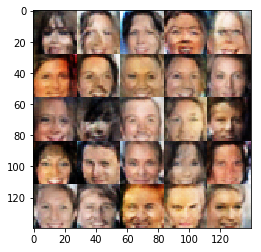

Epoch 1/3... Discriminator Loss: 1.2371... Generator Loss: 0.4764
Epoch 1/3... Discriminator Loss: 1.4316... Generator Loss: 0.5862
Epoch 1/3... Discriminator Loss: 1.3573... Generator Loss: 0.5212
Epoch 1/3... Discriminator Loss: 1.2771... Generator Loss: 0.6354
Epoch 1/3... Discriminator Loss: 1.1782... Generator Loss: 0.7546
Epoch 1/3... Discriminator Loss: 0.8612... Generator Loss: 0.8849
Epoch 1/3... Discriminator Loss: 1.1712... Generator Loss: 1.0285
Epoch 1/3... Discriminator Loss: 0.9357... Generator Loss: 1.1513
Epoch 1/3... Discriminator Loss: 1.0321... Generator Loss: 0.6819
Epoch 1/3... Discriminator Loss: 0.8422... Generator Loss: 0.8964


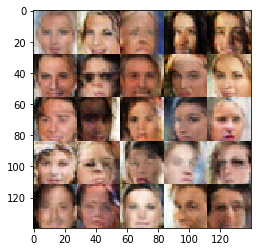

Epoch 1/3... Discriminator Loss: 1.3534... Generator Loss: 0.9942
Epoch 1/3... Discriminator Loss: 1.6048... Generator Loss: 0.4509
Epoch 1/3... Discriminator Loss: 1.2847... Generator Loss: 0.5477
Epoch 1/3... Discriminator Loss: 1.4465... Generator Loss: 0.4458
Epoch 1/3... Discriminator Loss: 1.4420... Generator Loss: 0.3936
Epoch 1/3... Discriminator Loss: 1.3464... Generator Loss: 0.9245
Epoch 1/3... Discriminator Loss: 1.5261... Generator Loss: 0.3657
Epoch 1/3... Discriminator Loss: 1.2945... Generator Loss: 0.5249
Epoch 1/3... Discriminator Loss: 0.9218... Generator Loss: 1.0601
Epoch 1/3... Discriminator Loss: 1.1892... Generator Loss: 0.7557


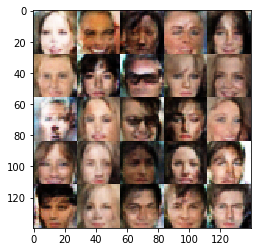

Epoch 1/3... Discriminator Loss: 1.1159... Generator Loss: 0.6757
Epoch 1/3... Discriminator Loss: 1.2127... Generator Loss: 0.7961
Epoch 1/3... Discriminator Loss: 1.5421... Generator Loss: 0.3317
Epoch 1/3... Discriminator Loss: 1.1610... Generator Loss: 0.5515
Epoch 1/3... Discriminator Loss: 1.8707... Generator Loss: 0.2201
Epoch 1/3... Discriminator Loss: 1.4831... Generator Loss: 0.4174
Epoch 1/3... Discriminator Loss: 1.4333... Generator Loss: 0.4826
Epoch 1/3... Discriminator Loss: 2.0967... Generator Loss: 0.2011
Epoch 1/3... Discriminator Loss: 1.0318... Generator Loss: 0.8119
Epoch 1/3... Discriminator Loss: 0.9957... Generator Loss: 0.7434


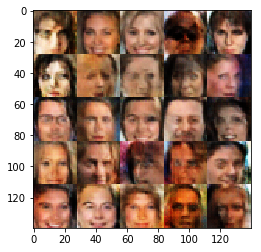

Epoch 1/3... Discriminator Loss: 1.4450... Generator Loss: 0.3292
Epoch 1/3... Discriminator Loss: 1.8460... Generator Loss: 0.2843
Epoch 1/3... Discriminator Loss: 1.0671... Generator Loss: 1.3721
Epoch 1/3... Discriminator Loss: 1.1998... Generator Loss: 0.5043
Epoch 1/3... Discriminator Loss: 1.9353... Generator Loss: 0.2475
Epoch 1/3... Discriminator Loss: 1.1563... Generator Loss: 0.6735
Epoch 1/3... Discriminator Loss: 1.7348... Generator Loss: 0.2769
Epoch 1/3... Discriminator Loss: 1.3549... Generator Loss: 0.4073
Epoch 1/3... Discriminator Loss: 1.2958... Generator Loss: 0.4441
Epoch 1/3... Discriminator Loss: 1.4724... Generator Loss: 0.3957


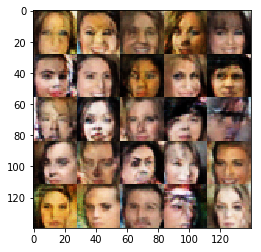

Epoch 1/3... Discriminator Loss: 1.0717... Generator Loss: 0.7635
Epoch 1/3... Discriminator Loss: 1.1228... Generator Loss: 1.9385
Epoch 1/3... Discriminator Loss: 1.2241... Generator Loss: 0.7493
Epoch 1/3... Discriminator Loss: 1.5508... Generator Loss: 0.3388
Epoch 1/3... Discriminator Loss: 1.4169... Generator Loss: 0.4295
Epoch 1/3... Discriminator Loss: 1.2545... Generator Loss: 0.5747
Epoch 1/3... Discriminator Loss: 1.6792... Generator Loss: 0.3462
Epoch 1/3... Discriminator Loss: 0.8218... Generator Loss: 1.2510
Epoch 1/3... Discriminator Loss: 1.5426... Generator Loss: 0.3670
Epoch 1/3... Discriminator Loss: 1.0984... Generator Loss: 1.2317


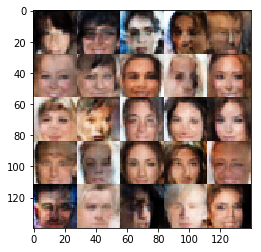

Epoch 1/3... Discriminator Loss: 1.0961... Generator Loss: 0.6245
Epoch 1/3... Discriminator Loss: 1.2085... Generator Loss: 0.6399
Epoch 1/3... Discriminator Loss: 1.5954... Generator Loss: 0.3041
Epoch 1/3... Discriminator Loss: 1.3118... Generator Loss: 0.6110
Epoch 1/3... Discriminator Loss: 1.7574... Generator Loss: 0.4325
Epoch 1/3... Discriminator Loss: 1.0750... Generator Loss: 0.7562
Epoch 1/3... Discriminator Loss: 0.8296... Generator Loss: 1.0263
Epoch 1/3... Discriminator Loss: 1.6714... Generator Loss: 0.2739
Epoch 1/3... Discriminator Loss: 1.8237... Generator Loss: 0.3132
Epoch 1/3... Discriminator Loss: 1.4083... Generator Loss: 0.4226


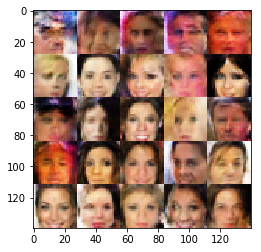

Epoch 1/3... Discriminator Loss: 1.4959... Generator Loss: 0.2710
Epoch 1/3... Discriminator Loss: 1.3200... Generator Loss: 0.4543
Epoch 1/3... Discriminator Loss: 1.3316... Generator Loss: 1.0709
Epoch 1/3... Discriminator Loss: 1.6590... Generator Loss: 0.3038
Epoch 1/3... Discriminator Loss: 1.3163... Generator Loss: 0.4170
Epoch 1/3... Discriminator Loss: 1.4956... Generator Loss: 0.3651
Epoch 1/3... Discriminator Loss: 1.3954... Generator Loss: 0.4322
Epoch 1/3... Discriminator Loss: 1.3573... Generator Loss: 0.6270
Epoch 1/3... Discriminator Loss: 1.5544... Generator Loss: 0.2682
Epoch 1/3... Discriminator Loss: 1.3938... Generator Loss: 0.4627


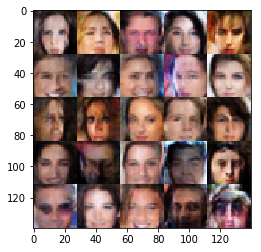

Epoch 1/3... Discriminator Loss: 0.9996... Generator Loss: 1.2953
Epoch 1/3... Discriminator Loss: 1.0413... Generator Loss: 0.6703
Epoch 1/3... Discriminator Loss: 1.1735... Generator Loss: 0.9526
Epoch 1/3... Discriminator Loss: 1.4762... Generator Loss: 0.3590
Epoch 1/3... Discriminator Loss: 1.0954... Generator Loss: 1.5479
Epoch 1/3... Discriminator Loss: 1.2105... Generator Loss: 0.8366
Epoch 1/3... Discriminator Loss: 1.0207... Generator Loss: 1.3196
Epoch 1/3... Discriminator Loss: 1.1169... Generator Loss: 0.8844
Epoch 1/3... Discriminator Loss: 1.4686... Generator Loss: 0.4613
Epoch 1/3... Discriminator Loss: 1.0056... Generator Loss: 0.8941


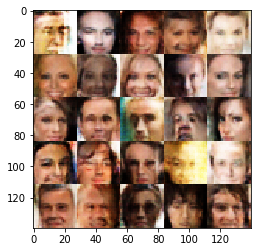

Epoch 1/3... Discriminator Loss: 1.2690... Generator Loss: 0.4952
Epoch 1/3... Discriminator Loss: 1.1533... Generator Loss: 0.5548
Epoch 1/3... Discriminator Loss: 1.1669... Generator Loss: 0.5629
Epoch 1/3... Discriminator Loss: 1.0959... Generator Loss: 0.5565
Epoch 1/3... Discriminator Loss: 0.8427... Generator Loss: 1.3104
Epoch 1/3... Discriminator Loss: 0.9152... Generator Loss: 0.8951
Epoch 1/3... Discriminator Loss: 1.6477... Generator Loss: 0.3242
Epoch 1/3... Discriminator Loss: 1.1568... Generator Loss: 0.7048
Epoch 1/3... Discriminator Loss: 2.1138... Generator Loss: 0.2061
Epoch 1/3... Discriminator Loss: 1.3070... Generator Loss: 0.4494


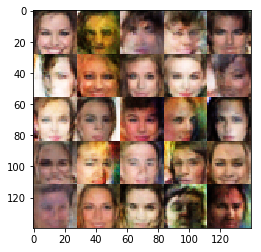

Epoch 1/3... Discriminator Loss: 1.1333... Generator Loss: 0.6416
Epoch 1/3... Discriminator Loss: 1.4863... Generator Loss: 0.3498
Epoch 1/3... Discriminator Loss: 1.0462... Generator Loss: 1.1587
Epoch 1/3... Discriminator Loss: 1.3981... Generator Loss: 0.3468
Epoch 1/3... Discriminator Loss: 1.2527... Generator Loss: 0.5771
Epoch 1/3... Discriminator Loss: 1.0427... Generator Loss: 0.8678
Epoch 1/3... Discriminator Loss: 1.4192... Generator Loss: 0.6256
Epoch 1/3... Discriminator Loss: 1.1654... Generator Loss: 0.8318
Epoch 1/3... Discriminator Loss: 1.0361... Generator Loss: 0.5709
Epoch 1/3... Discriminator Loss: 1.1943... Generator Loss: 0.6318


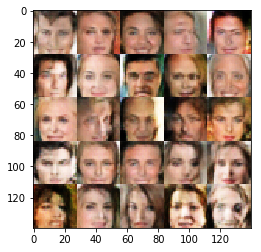

Epoch 1/3... Discriminator Loss: 1.3037... Generator Loss: 0.4187
Epoch 1/3... Discriminator Loss: 1.0100... Generator Loss: 0.5985
Epoch 1/3... Discriminator Loss: 1.2451... Generator Loss: 1.2754
Epoch 1/3... Discriminator Loss: 1.3607... Generator Loss: 0.7897
Epoch 1/3... Discriminator Loss: 1.0276... Generator Loss: 0.9111
Epoch 1/3... Discriminator Loss: 1.5239... Generator Loss: 0.3176
Epoch 1/3... Discriminator Loss: 1.1920... Generator Loss: 0.7170
Epoch 1/3... Discriminator Loss: 1.4027... Generator Loss: 0.3437
Epoch 1/3... Discriminator Loss: 0.9293... Generator Loss: 1.0542
Epoch 1/3... Discriminator Loss: 1.2655... Generator Loss: 0.5393


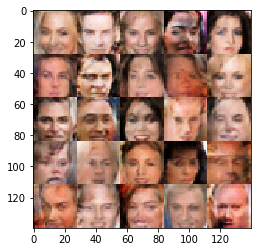

Epoch 1/3... Discriminator Loss: 1.0013... Generator Loss: 0.8815
Epoch 1/3... Discriminator Loss: 1.0252... Generator Loss: 1.2128
Epoch 1/3... Discriminator Loss: 0.8955... Generator Loss: 0.8886
Epoch 1/3... Discriminator Loss: 0.9211... Generator Loss: 1.2797
Epoch 1/3... Discriminator Loss: 1.5269... Generator Loss: 0.3648
Epoch 1/3... Discriminator Loss: 1.0554... Generator Loss: 1.2432
Epoch 1/3... Discriminator Loss: 0.9835... Generator Loss: 0.9724
Epoch 1/3... Discriminator Loss: 1.2836... Generator Loss: 1.5048
Epoch 1/3... Discriminator Loss: 1.1715... Generator Loss: 0.5391
Epoch 1/3... Discriminator Loss: 1.4788... Generator Loss: 0.4942


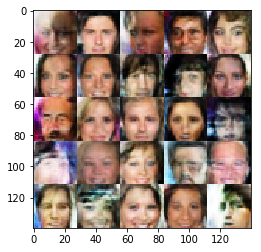

Epoch 1/3... Discriminator Loss: 1.1072... Generator Loss: 0.6345
Epoch 1/3... Discriminator Loss: 1.3110... Generator Loss: 0.6681
Epoch 1/3... Discriminator Loss: 1.4137... Generator Loss: 0.4463
Epoch 1/3... Discriminator Loss: 1.1148... Generator Loss: 1.1795
Epoch 1/3... Discriminator Loss: 1.0121... Generator Loss: 0.7363
Epoch 1/3... Discriminator Loss: 1.4833... Generator Loss: 0.3575
Epoch 1/3... Discriminator Loss: 1.2750... Generator Loss: 0.4542
Epoch 1/3... Discriminator Loss: 1.1814... Generator Loss: 0.7527
Epoch 1/3... Discriminator Loss: 1.7746... Generator Loss: 0.2796
Epoch 1/3... Discriminator Loss: 1.3051... Generator Loss: 0.4808


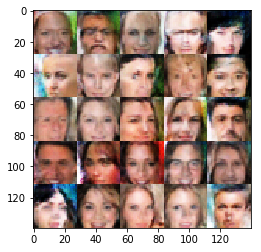

Epoch 1/3... Discriminator Loss: 1.2525... Generator Loss: 0.4723
Epoch 1/3... Discriminator Loss: 1.6285... Generator Loss: 0.3423
Epoch 1/3... Discriminator Loss: 1.3682... Generator Loss: 0.3848
Epoch 1/3... Discriminator Loss: 1.2779... Generator Loss: 0.5684
Epoch 1/3... Discriminator Loss: 1.2766... Generator Loss: 0.5201
Epoch 1/3... Discriminator Loss: 1.0582... Generator Loss: 0.8928
Epoch 1/3... Discriminator Loss: 1.3644... Generator Loss: 0.5666
Epoch 1/3... Discriminator Loss: 0.9498... Generator Loss: 1.0125
Epoch 1/3... Discriminator Loss: 1.1191... Generator Loss: 0.6479
Epoch 1/3... Discriminator Loss: 1.5756... Generator Loss: 0.3150


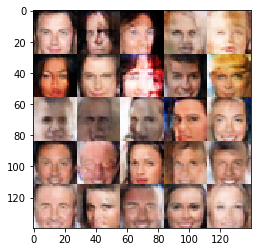

Epoch 1/3... Discriminator Loss: 1.0919... Generator Loss: 0.9998
Epoch 1/3... Discriminator Loss: 1.0400... Generator Loss: 0.8849
Epoch 1/3... Discriminator Loss: 1.2218... Generator Loss: 0.5040
Epoch 1/3... Discriminator Loss: 1.0466... Generator Loss: 1.0148
Epoch 1/3... Discriminator Loss: 1.0654... Generator Loss: 1.0077
Epoch 1/3... Discriminator Loss: 1.1508... Generator Loss: 0.6414
Epoch 1/3... Discriminator Loss: 1.1910... Generator Loss: 0.6287
Epoch 1/3... Discriminator Loss: 1.6359... Generator Loss: 0.3355
Epoch 1/3... Discriminator Loss: 1.0248... Generator Loss: 0.7248
Epoch 1/3... Discriminator Loss: 1.6533... Generator Loss: 0.6402


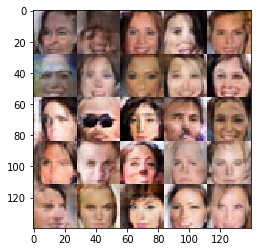

Epoch 1/3... Discriminator Loss: 1.1162... Generator Loss: 0.8241
Epoch 1/3... Discriminator Loss: 1.1596... Generator Loss: 0.4797
Epoch 1/3... Discriminator Loss: 1.1091... Generator Loss: 0.9867
Epoch 1/3... Discriminator Loss: 1.0956... Generator Loss: 1.0753
Epoch 1/3... Discriminator Loss: 1.3558... Generator Loss: 0.3945
Epoch 1/3... Discriminator Loss: 1.1946... Generator Loss: 0.7644
Epoch 1/3... Discriminator Loss: 0.8947... Generator Loss: 0.9686
Epoch 1/3... Discriminator Loss: 1.1743... Generator Loss: 0.5080
Epoch 1/3... Discriminator Loss: 1.4431... Generator Loss: 0.3595
Epoch 1/3... Discriminator Loss: 1.0205... Generator Loss: 0.8803


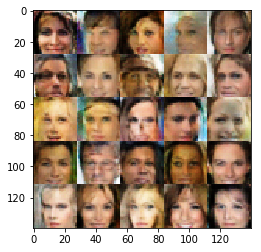

Epoch 1/3... Discriminator Loss: 1.1978... Generator Loss: 1.0126
Epoch 1/3... Discriminator Loss: 1.2664... Generator Loss: 0.5480
Epoch 1/3... Discriminator Loss: 0.8349... Generator Loss: 1.1738
Epoch 1/3... Discriminator Loss: 1.2442... Generator Loss: 0.7365
Epoch 1/3... Discriminator Loss: 1.2126... Generator Loss: 0.4853
Epoch 1/3... Discriminator Loss: 0.9606... Generator Loss: 0.7174
Epoch 1/3... Discriminator Loss: 0.9689... Generator Loss: 1.3462
Epoch 1/3... Discriminator Loss: 1.0666... Generator Loss: 0.7439
Epoch 1/3... Discriminator Loss: 1.2422... Generator Loss: 0.6133
Epoch 1/3... Discriminator Loss: 1.3445... Generator Loss: 0.3942


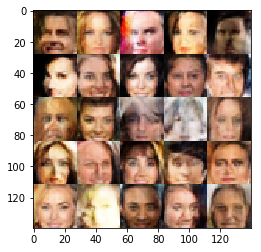

Epoch 1/3... Discriminator Loss: 1.0000... Generator Loss: 0.7674
Epoch 1/3... Discriminator Loss: 1.0489... Generator Loss: 1.6094
Epoch 1/3... Discriminator Loss: 0.8810... Generator Loss: 1.0130
Epoch 1/3... Discriminator Loss: 1.0242... Generator Loss: 1.0295
Epoch 1/3... Discriminator Loss: 1.2403... Generator Loss: 0.4242
Epoch 1/3... Discriminator Loss: 0.9078... Generator Loss: 1.2210
Epoch 1/3... Discriminator Loss: 1.2220... Generator Loss: 0.4722
Epoch 1/3... Discriminator Loss: 0.9085... Generator Loss: 1.1200
Epoch 1/3... Discriminator Loss: 1.0130... Generator Loss: 1.1153
Epoch 1/3... Discriminator Loss: 1.0953... Generator Loss: 0.7553


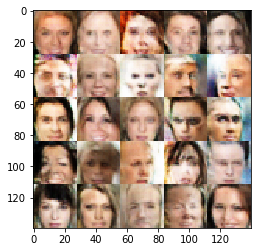

Epoch 1/3... Discriminator Loss: 1.4455... Generator Loss: 0.3517
Epoch 1/3... Discriminator Loss: 1.0903... Generator Loss: 0.9185
Epoch 1/3... Discriminator Loss: 1.2645... Generator Loss: 0.7855
Epoch 1/3... Discriminator Loss: 0.9380... Generator Loss: 0.7248
Epoch 1/3... Discriminator Loss: 1.1784... Generator Loss: 0.8151
Epoch 1/3... Discriminator Loss: 1.1462... Generator Loss: 0.4441
Epoch 1/3... Discriminator Loss: 1.3372... Generator Loss: 0.8674
Epoch 1/3... Discriminator Loss: 0.9762... Generator Loss: 0.8107
Epoch 1/3... Discriminator Loss: 0.9811... Generator Loss: 1.0734
Epoch 1/3... Discriminator Loss: 0.9639... Generator Loss: 0.7336


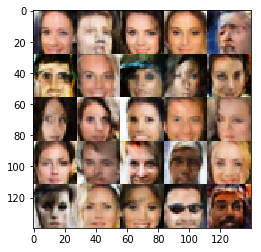

Epoch 1/3... Discriminator Loss: 1.0614... Generator Loss: 0.7084
Epoch 1/3... Discriminator Loss: 1.4071... Generator Loss: 0.4385
Epoch 1/3... Discriminator Loss: 1.3106... Generator Loss: 0.4467
Epoch 1/3... Discriminator Loss: 0.9182... Generator Loss: 2.1832
Epoch 1/3... Discriminator Loss: 1.1628... Generator Loss: 0.6072
Epoch 1/3... Discriminator Loss: 1.5648... Generator Loss: 0.2778
Epoch 1/3... Discriminator Loss: 1.0267... Generator Loss: 0.9488
Epoch 1/3... Discriminator Loss: 1.4127... Generator Loss: 0.3830
Epoch 1/3... Discriminator Loss: 1.2089... Generator Loss: 0.4681
Epoch 1/3... Discriminator Loss: 1.1759... Generator Loss: 0.8655


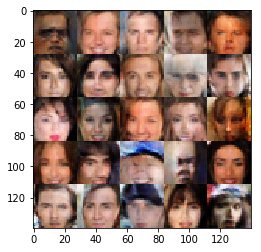

Epoch 1/3... Discriminator Loss: 1.4506... Generator Loss: 0.3474
Epoch 1/3... Discriminator Loss: 0.8611... Generator Loss: 0.8214
Epoch 1/3... Discriminator Loss: 1.3125... Generator Loss: 0.5810
Epoch 1/3... Discriminator Loss: 1.0318... Generator Loss: 0.8705
Epoch 1/3... Discriminator Loss: 1.1276... Generator Loss: 0.4353
Epoch 1/3... Discriminator Loss: 1.3606... Generator Loss: 0.6350
Epoch 1/3... Discriminator Loss: 1.5004... Generator Loss: 0.2667
Epoch 1/3... Discriminator Loss: 1.1316... Generator Loss: 0.9106
Epoch 1/3... Discriminator Loss: 1.1178... Generator Loss: 1.0628
Epoch 1/3... Discriminator Loss: 1.1057... Generator Loss: 0.8859


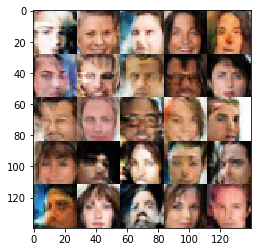

Epoch 1/3... Discriminator Loss: 1.0649... Generator Loss: 0.8557
Epoch 1/3... Discriminator Loss: 0.9652... Generator Loss: 1.0065
Epoch 1/3... Discriminator Loss: 1.1628... Generator Loss: 0.8899
Epoch 1/3... Discriminator Loss: 1.5354... Generator Loss: 0.3227
Epoch 1/3... Discriminator Loss: 1.2766... Generator Loss: 0.5319
Epoch 1/3... Discriminator Loss: 0.7606... Generator Loss: 1.2414
Epoch 1/3... Discriminator Loss: 0.9632... Generator Loss: 0.8794
Epoch 1/3... Discriminator Loss: 1.2077... Generator Loss: 0.4093
Epoch 1/3... Discriminator Loss: 1.1202... Generator Loss: 0.5977
Epoch 1/3... Discriminator Loss: 1.4135... Generator Loss: 0.9639


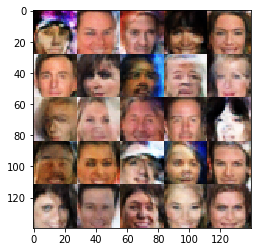

Epoch 1/3... Discriminator Loss: 0.9897... Generator Loss: 0.9418
Epoch 1/3... Discriminator Loss: 1.2895... Generator Loss: 0.4699
Epoch 1/3... Discriminator Loss: 1.0686... Generator Loss: 0.7307
Epoch 1/3... Discriminator Loss: 0.9594... Generator Loss: 1.0484
Epoch 1/3... Discriminator Loss: 1.0472... Generator Loss: 0.9053
Epoch 1/3... Discriminator Loss: 1.3855... Generator Loss: 0.9664
Epoch 1/3... Discriminator Loss: 1.2094... Generator Loss: 1.2725
Epoch 1/3... Discriminator Loss: 0.9817... Generator Loss: 1.1811
Epoch 1/3... Discriminator Loss: 1.1740... Generator Loss: 0.6857
Epoch 1/3... Discriminator Loss: 1.0410... Generator Loss: 1.2896


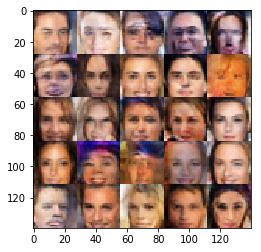

Epoch 1/3... Discriminator Loss: 1.8643... Generator Loss: 0.2332
Epoch 1/3... Discriminator Loss: 0.9838... Generator Loss: 1.0371
Epoch 1/3... Discriminator Loss: 1.0812... Generator Loss: 0.7287
Epoch 1/3... Discriminator Loss: 1.2532... Generator Loss: 0.5292
Epoch 1/3... Discriminator Loss: 1.1690... Generator Loss: 2.2618
Epoch 1/3... Discriminator Loss: 0.8273... Generator Loss: 0.6193
Epoch 1/3... Discriminator Loss: 1.2846... Generator Loss: 0.5509
Epoch 1/3... Discriminator Loss: 1.1689... Generator Loss: 0.5479
Epoch 1/3... Discriminator Loss: 1.8267... Generator Loss: 0.3183
Epoch 1/3... Discriminator Loss: 1.2358... Generator Loss: 0.4468


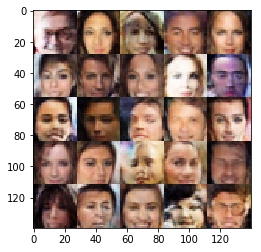

Epoch 1/3... Discriminator Loss: 1.5510... Generator Loss: 0.5531
Epoch 1/3... Discriminator Loss: 1.3000... Generator Loss: 0.8751
Epoch 1/3... Discriminator Loss: 1.6048... Generator Loss: 0.3208
Epoch 1/3... Discriminator Loss: 1.0465... Generator Loss: 0.6405
Epoch 1/3... Discriminator Loss: 1.5869... Generator Loss: 0.4984
Epoch 1/3... Discriminator Loss: 1.4756... Generator Loss: 0.3565
Epoch 1/3... Discriminator Loss: 1.0074... Generator Loss: 0.8535
Epoch 1/3... Discriminator Loss: 1.3617... Generator Loss: 0.4465
Epoch 1/3... Discriminator Loss: 1.1884... Generator Loss: 0.6425
Epoch 1/3... Discriminator Loss: 1.0167... Generator Loss: 1.1678


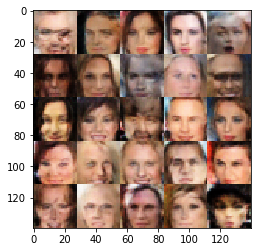

Epoch 1/3... Discriminator Loss: 1.3166... Generator Loss: 0.7534
Epoch 1/3... Discriminator Loss: 1.0871... Generator Loss: 1.1134
Epoch 1/3... Discriminator Loss: 1.1517... Generator Loss: 0.9796
Epoch 1/3... Discriminator Loss: 1.1743... Generator Loss: 0.6501
Epoch 1/3... Discriminator Loss: 1.0813... Generator Loss: 1.3809
Epoch 1/3... Discriminator Loss: 0.9692... Generator Loss: 1.2149
Epoch 1/3... Discriminator Loss: 1.0232... Generator Loss: 0.7690
Epoch 1/3... Discriminator Loss: 1.1878... Generator Loss: 0.6324
Epoch 1/3... Discriminator Loss: 1.7199... Generator Loss: 0.3366
Epoch 1/3... Discriminator Loss: 1.2209... Generator Loss: 0.5606


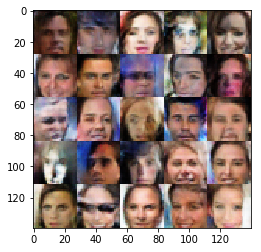

Epoch 1/3... Discriminator Loss: 1.1458... Generator Loss: 0.5870
Epoch 1/3... Discriminator Loss: 1.0554... Generator Loss: 0.5490
Epoch 1/3... Discriminator Loss: 0.8934... Generator Loss: 0.9906
Epoch 1/3... Discriminator Loss: 0.9851... Generator Loss: 1.4837
Epoch 1/3... Discriminator Loss: 1.3533... Generator Loss: 0.4979
Epoch 1/3... Discriminator Loss: 1.2545... Generator Loss: 0.4425
Epoch 1/3... Discriminator Loss: 1.0451... Generator Loss: 0.4476
Epoch 1/3... Discriminator Loss: 1.2981... Generator Loss: 0.3628
Epoch 1/3... Discriminator Loss: 1.1826... Generator Loss: 0.6824
Epoch 1/3... Discriminator Loss: 1.2565... Generator Loss: 0.8632


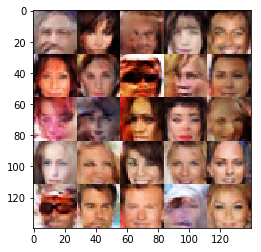

Epoch 1/3... Discriminator Loss: 1.5768... Generator Loss: 0.3013
Epoch 1/3... Discriminator Loss: 1.4384... Generator Loss: 0.6938
Epoch 1/3... Discriminator Loss: 1.1465... Generator Loss: 0.9256
Epoch 1/3... Discriminator Loss: 1.1129... Generator Loss: 0.6335
Epoch 1/3... Discriminator Loss: 1.1301... Generator Loss: 0.6101
Epoch 1/3... Discriminator Loss: 1.0409... Generator Loss: 1.6344
Epoch 1/3... Discriminator Loss: 1.1922... Generator Loss: 0.6196
Epoch 1/3... Discriminator Loss: 1.1316... Generator Loss: 0.7923
Epoch 1/3... Discriminator Loss: 1.0750... Generator Loss: 0.8725
Epoch 1/3... Discriminator Loss: 1.3198... Generator Loss: 0.4179


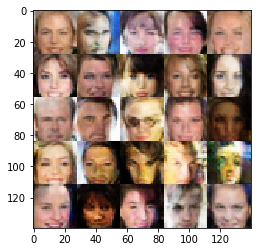

Epoch 1/3... Discriminator Loss: 1.2572... Generator Loss: 0.5148
Epoch 1/3... Discriminator Loss: 1.4706... Generator Loss: 0.4295
Epoch 1/3... Discriminator Loss: 1.1711... Generator Loss: 0.4816
Epoch 1/3... Discriminator Loss: 2.0722... Generator Loss: 0.1359
Epoch 1/3... Discriminator Loss: 1.1871... Generator Loss: 0.4846
Epoch 1/3... Discriminator Loss: 1.2726... Generator Loss: 0.5180
Epoch 1/3... Discriminator Loss: 1.0762... Generator Loss: 0.4896
Epoch 1/3... Discriminator Loss: 1.0435... Generator Loss: 1.0430
Epoch 1/3... Discriminator Loss: 1.1242... Generator Loss: 0.9940
Epoch 1/3... Discriminator Loss: 0.9219... Generator Loss: 0.9426


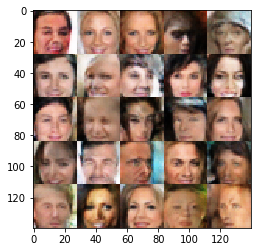

Epoch 1/3... Discriminator Loss: 1.2170... Generator Loss: 0.7640
Epoch 1/3... Discriminator Loss: 1.1404... Generator Loss: 0.5950
Epoch 1/3... Discriminator Loss: 0.8620... Generator Loss: 1.0019
Epoch 1/3... Discriminator Loss: 1.4286... Generator Loss: 0.5441
Epoch 1/3... Discriminator Loss: 1.2038... Generator Loss: 0.4989
Epoch 1/3... Discriminator Loss: 1.2360... Generator Loss: 0.4528
Epoch 1/3... Discriminator Loss: 0.8201... Generator Loss: 0.7911
Epoch 1/3... Discriminator Loss: 1.1285... Generator Loss: 0.8184
Epoch 1/3... Discriminator Loss: 0.8970... Generator Loss: 1.1337
Epoch 1/3... Discriminator Loss: 1.2100... Generator Loss: 0.6020


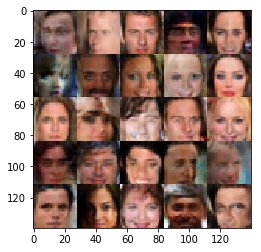

Epoch 1/3... Discriminator Loss: 1.3385... Generator Loss: 0.3209
Epoch 1/3... Discriminator Loss: 1.2136... Generator Loss: 0.6073
Epoch 1/3... Discriminator Loss: 0.6871... Generator Loss: 1.4219
Epoch 1/3... Discriminator Loss: 1.4930... Generator Loss: 0.3482
Epoch 1/3... Discriminator Loss: 1.4291... Generator Loss: 0.4523
Epoch 1/3... Discriminator Loss: 1.0059... Generator Loss: 1.6997
Epoch 1/3... Discriminator Loss: 0.9603... Generator Loss: 0.9376
Epoch 1/3... Discriminator Loss: 0.9887... Generator Loss: 0.8124
Epoch 1/3... Discriminator Loss: 1.4681... Generator Loss: 0.6423
Epoch 1/3... Discriminator Loss: 1.5953... Generator Loss: 0.3444


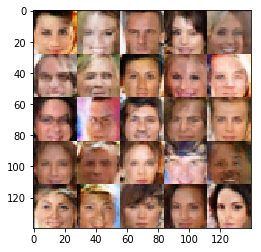

Epoch 1/3... Discriminator Loss: 1.2611... Generator Loss: 0.7856
Epoch 1/3... Discriminator Loss: 1.0916... Generator Loss: 0.8271
Epoch 1/3... Discriminator Loss: 1.5945... Generator Loss: 0.3944
Epoch 1/3... Discriminator Loss: 0.9442... Generator Loss: 0.7032
Epoch 1/3... Discriminator Loss: 0.9990... Generator Loss: 1.0437
Epoch 1/3... Discriminator Loss: 1.2795... Generator Loss: 0.5121
Epoch 1/3... Discriminator Loss: 1.5082... Generator Loss: 0.3695
Epoch 1/3... Discriminator Loss: 1.0007... Generator Loss: 0.8640
Epoch 1/3... Discriminator Loss: 1.2045... Generator Loss: 0.5700
Epoch 1/3... Discriminator Loss: 1.2046... Generator Loss: 0.6453


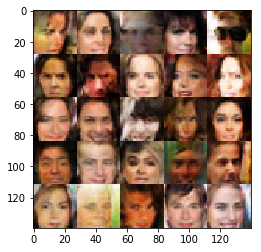

Epoch 1/3... Discriminator Loss: 1.0116... Generator Loss: 0.9487
Epoch 1/3... Discriminator Loss: 1.3138... Generator Loss: 0.4841
Epoch 1/3... Discriminator Loss: 1.2566... Generator Loss: 0.5428
Epoch 1/3... Discriminator Loss: 1.1105... Generator Loss: 0.5692
Epoch 1/3... Discriminator Loss: 1.7225... Generator Loss: 0.2414
Epoch 1/3... Discriminator Loss: 0.9792... Generator Loss: 0.8516
Epoch 1/3... Discriminator Loss: 1.3616... Generator Loss: 1.2201
Epoch 1/3... Discriminator Loss: 0.9084... Generator Loss: 0.6820
Epoch 1/3... Discriminator Loss: 1.1574... Generator Loss: 0.5377
Epoch 1/3... Discriminator Loss: 0.7480... Generator Loss: 1.5165


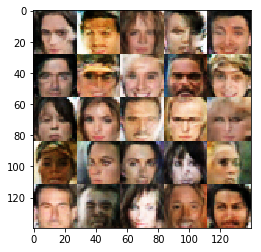

Epoch 1/3... Discriminator Loss: 0.8929... Generator Loss: 0.6709
Epoch 1/3... Discriminator Loss: 1.0086... Generator Loss: 0.7453
Epoch 1/3... Discriminator Loss: 1.2249... Generator Loss: 0.4221
Epoch 1/3... Discriminator Loss: 1.2391... Generator Loss: 0.6302
Epoch 1/3... Discriminator Loss: 1.0392... Generator Loss: 0.6394
Epoch 1/3... Discriminator Loss: 1.1155... Generator Loss: 0.4228
Epoch 1/3... Discriminator Loss: 1.1886... Generator Loss: 0.5608
Epoch 1/3... Discriminator Loss: 1.3705... Generator Loss: 0.6282
Epoch 1/3... Discriminator Loss: 0.8921... Generator Loss: 1.1076
Epoch 1/3... Discriminator Loss: 1.0749... Generator Loss: 1.7008


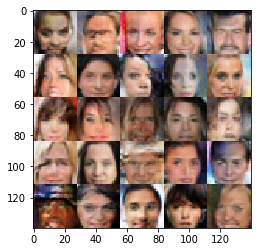

Epoch 1/3... Discriminator Loss: 0.9309... Generator Loss: 1.6386
Epoch 1/3... Discriminator Loss: 1.3629... Generator Loss: 0.4294
Epoch 1/3... Discriminator Loss: 0.7501... Generator Loss: 0.9903
Epoch 1/3... Discriminator Loss: 1.1359... Generator Loss: 1.0362
Epoch 1/3... Discriminator Loss: 1.3881... Generator Loss: 0.3962
Epoch 1/3... Discriminator Loss: 1.3756... Generator Loss: 0.4041
Epoch 1/3... Discriminator Loss: 1.2341... Generator Loss: 1.4514
Epoch 1/3... Discriminator Loss: 1.0381... Generator Loss: 0.9694
Epoch 1/3... Discriminator Loss: 0.9768... Generator Loss: 1.8262
Epoch 1/3... Discriminator Loss: 1.2924... Generator Loss: 0.4530


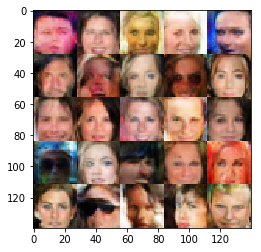

Epoch 1/3... Discriminator Loss: 1.0964... Generator Loss: 0.6585
Epoch 1/3... Discriminator Loss: 0.9773... Generator Loss: 1.2346
Epoch 1/3... Discriminator Loss: 1.7205... Generator Loss: 0.3283
Epoch 2/3... Discriminator Loss: 1.1357... Generator Loss: 0.5553
Epoch 2/3... Discriminator Loss: 1.2643... Generator Loss: 0.8225
Epoch 2/3... Discriminator Loss: 1.4200... Generator Loss: 1.9205
Epoch 2/3... Discriminator Loss: 1.0009... Generator Loss: 0.7965
Epoch 2/3... Discriminator Loss: 1.2864... Generator Loss: 0.7754
Epoch 2/3... Discriminator Loss: 1.4960... Generator Loss: 0.3932
Epoch 2/3... Discriminator Loss: 0.7939... Generator Loss: 1.2802


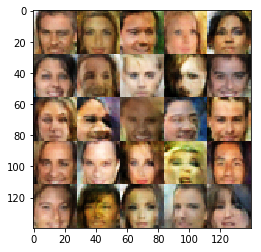

Epoch 2/3... Discriminator Loss: 1.1017... Generator Loss: 0.7895
Epoch 2/3... Discriminator Loss: 1.0856... Generator Loss: 0.9958
Epoch 2/3... Discriminator Loss: 1.1003... Generator Loss: 0.7835
Epoch 2/3... Discriminator Loss: 1.1956... Generator Loss: 1.8847
Epoch 2/3... Discriminator Loss: 1.4156... Generator Loss: 0.9631
Epoch 2/3... Discriminator Loss: 1.0384... Generator Loss: 0.6672
Epoch 2/3... Discriminator Loss: 1.0455... Generator Loss: 0.5809
Epoch 2/3... Discriminator Loss: 1.0796... Generator Loss: 0.5088
Epoch 2/3... Discriminator Loss: 1.6776... Generator Loss: 0.3401
Epoch 2/3... Discriminator Loss: 2.0307... Generator Loss: 0.3368


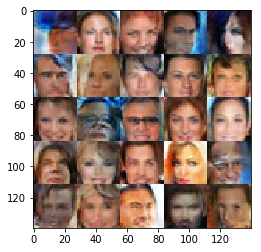

Epoch 2/3... Discriminator Loss: 1.0898... Generator Loss: 0.9398
Epoch 2/3... Discriminator Loss: 0.8226... Generator Loss: 1.2559
Epoch 2/3... Discriminator Loss: 0.8894... Generator Loss: 0.7249
Epoch 2/3... Discriminator Loss: 1.1256... Generator Loss: 0.5977
Epoch 2/3... Discriminator Loss: 1.1429... Generator Loss: 1.0564
Epoch 2/3... Discriminator Loss: 1.5149... Generator Loss: 0.4624
Epoch 2/3... Discriminator Loss: 1.1624... Generator Loss: 0.5150
Epoch 2/3... Discriminator Loss: 1.6046... Generator Loss: 0.3410
Epoch 2/3... Discriminator Loss: 1.2760... Generator Loss: 0.5514
Epoch 2/3... Discriminator Loss: 1.0094... Generator Loss: 1.3029


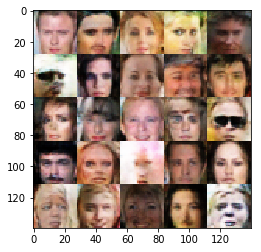

Epoch 2/3... Discriminator Loss: 1.3164... Generator Loss: 0.4990
Epoch 2/3... Discriminator Loss: 1.3077... Generator Loss: 0.7579
Epoch 2/3... Discriminator Loss: 1.1797... Generator Loss: 0.6402
Epoch 2/3... Discriminator Loss: 0.8203... Generator Loss: 1.8413
Epoch 2/3... Discriminator Loss: 1.1650... Generator Loss: 0.8336
Epoch 2/3... Discriminator Loss: 1.4908... Generator Loss: 0.5654
Epoch 2/3... Discriminator Loss: 1.1114... Generator Loss: 0.7605
Epoch 2/3... Discriminator Loss: 1.5304... Generator Loss: 0.6548
Epoch 2/3... Discriminator Loss: 1.3268... Generator Loss: 0.4266
Epoch 2/3... Discriminator Loss: 1.7292... Generator Loss: 0.3932


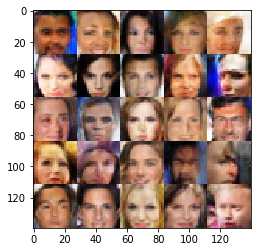

Epoch 2/3... Discriminator Loss: 1.0080... Generator Loss: 0.6661
Epoch 2/3... Discriminator Loss: 1.6545... Generator Loss: 0.3140
Epoch 2/3... Discriminator Loss: 0.9663... Generator Loss: 0.6807
Epoch 2/3... Discriminator Loss: 1.0356... Generator Loss: 0.7148
Epoch 2/3... Discriminator Loss: 1.3376... Generator Loss: 0.3875
Epoch 2/3... Discriminator Loss: 1.0291... Generator Loss: 0.6896
Epoch 2/3... Discriminator Loss: 1.0475... Generator Loss: 0.5886
Epoch 2/3... Discriminator Loss: 0.9596... Generator Loss: 1.0691
Epoch 2/3... Discriminator Loss: 1.0897... Generator Loss: 0.6526
Epoch 2/3... Discriminator Loss: 0.8458... Generator Loss: 0.8985


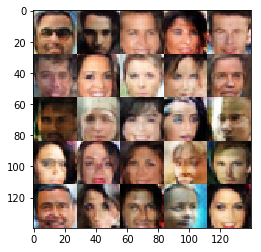

Epoch 2/3... Discriminator Loss: 1.0499... Generator Loss: 0.6808
Epoch 2/3... Discriminator Loss: 1.2280... Generator Loss: 0.4807
Epoch 2/3... Discriminator Loss: 0.9429... Generator Loss: 0.9002
Epoch 2/3... Discriminator Loss: 1.0838... Generator Loss: 0.4816
Epoch 2/3... Discriminator Loss: 1.0537... Generator Loss: 1.0871
Epoch 2/3... Discriminator Loss: 1.5092... Generator Loss: 0.4735
Epoch 2/3... Discriminator Loss: 1.1090... Generator Loss: 0.5843
Epoch 2/3... Discriminator Loss: 1.3430... Generator Loss: 0.5401
Epoch 2/3... Discriminator Loss: 0.9417... Generator Loss: 0.9827
Epoch 2/3... Discriminator Loss: 1.1602... Generator Loss: 1.8738


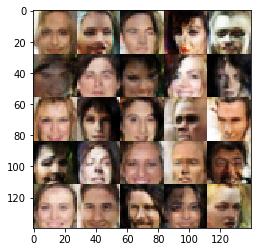

Epoch 2/3... Discriminator Loss: 1.2217... Generator Loss: 0.9226
Epoch 2/3... Discriminator Loss: 1.4309... Generator Loss: 0.4886
Epoch 2/3... Discriminator Loss: 1.1879... Generator Loss: 0.4877
Epoch 2/3... Discriminator Loss: 1.1667... Generator Loss: 1.0311
Epoch 2/3... Discriminator Loss: 1.1430... Generator Loss: 0.6906
Epoch 2/3... Discriminator Loss: 1.2371... Generator Loss: 0.6103
Epoch 2/3... Discriminator Loss: 0.7856... Generator Loss: 0.9859
Epoch 2/3... Discriminator Loss: 1.3004... Generator Loss: 0.3997
Epoch 2/3... Discriminator Loss: 1.1791... Generator Loss: 0.5851
Epoch 2/3... Discriminator Loss: 0.9956... Generator Loss: 0.9850


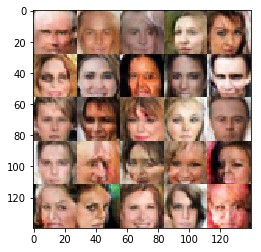

Epoch 2/3... Discriminator Loss: 1.2190... Generator Loss: 0.6916
Epoch 2/3... Discriminator Loss: 1.2670... Generator Loss: 0.5326
Epoch 2/3... Discriminator Loss: 1.3051... Generator Loss: 0.4292
Epoch 2/3... Discriminator Loss: 1.1005... Generator Loss: 0.6397
Epoch 2/3... Discriminator Loss: 0.9085... Generator Loss: 0.8189
Epoch 2/3... Discriminator Loss: 1.4339... Generator Loss: 0.4340
Epoch 2/3... Discriminator Loss: 1.1774... Generator Loss: 0.5690
Epoch 2/3... Discriminator Loss: 1.0786... Generator Loss: 0.7740
Epoch 2/3... Discriminator Loss: 1.0737... Generator Loss: 0.9023
Epoch 2/3... Discriminator Loss: 1.0941... Generator Loss: 0.6851


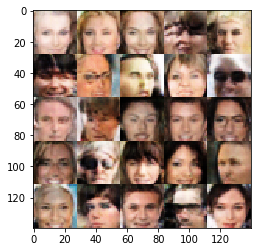

Epoch 2/3... Discriminator Loss: 1.0737... Generator Loss: 0.7779
Epoch 2/3... Discriminator Loss: 0.9611... Generator Loss: 1.2082
Epoch 2/3... Discriminator Loss: 1.1037... Generator Loss: 0.5378
Epoch 2/3... Discriminator Loss: 1.1149... Generator Loss: 0.5455
Epoch 2/3... Discriminator Loss: 1.0014... Generator Loss: 1.1941
Epoch 2/3... Discriminator Loss: 1.1819... Generator Loss: 0.6458
Epoch 2/3... Discriminator Loss: 1.0644... Generator Loss: 1.4740
Epoch 2/3... Discriminator Loss: 0.8544... Generator Loss: 0.6885
Epoch 2/3... Discriminator Loss: 1.0191... Generator Loss: 0.6328
Epoch 2/3... Discriminator Loss: 0.9588... Generator Loss: 0.9743


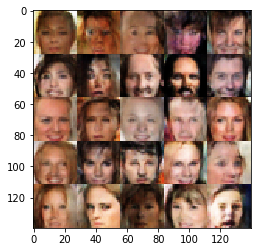

Epoch 2/3... Discriminator Loss: 1.0554... Generator Loss: 0.5962
Epoch 2/3... Discriminator Loss: 1.0779... Generator Loss: 0.8737
Epoch 2/3... Discriminator Loss: 0.7889... Generator Loss: 0.9564
Epoch 2/3... Discriminator Loss: 1.3528... Generator Loss: 0.3960
Epoch 2/3... Discriminator Loss: 0.9464... Generator Loss: 0.8241
Epoch 2/3... Discriminator Loss: 1.7577... Generator Loss: 0.2578
Epoch 2/3... Discriminator Loss: 1.0791... Generator Loss: 0.9253
Epoch 2/3... Discriminator Loss: 1.0193... Generator Loss: 0.7743
Epoch 2/3... Discriminator Loss: 1.1213... Generator Loss: 0.6126
Epoch 2/3... Discriminator Loss: 0.9332... Generator Loss: 0.8610


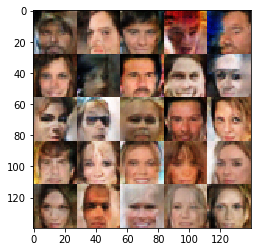

Epoch 2/3... Discriminator Loss: 1.2851... Generator Loss: 0.4098
Epoch 2/3... Discriminator Loss: 1.3614... Generator Loss: 0.2540
Epoch 2/3... Discriminator Loss: 1.1276... Generator Loss: 0.7872
Epoch 2/3... Discriminator Loss: 1.0851... Generator Loss: 0.7563
Epoch 2/3... Discriminator Loss: 1.0631... Generator Loss: 0.8551
Epoch 2/3... Discriminator Loss: 1.0669... Generator Loss: 0.9425
Epoch 2/3... Discriminator Loss: 1.0037... Generator Loss: 1.3231
Epoch 2/3... Discriminator Loss: 1.2726... Generator Loss: 0.4348
Epoch 2/3... Discriminator Loss: 1.1984... Generator Loss: 0.6313
Epoch 2/3... Discriminator Loss: 1.6410... Generator Loss: 0.2845


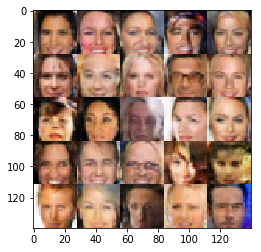

Epoch 2/3... Discriminator Loss: 1.0668... Generator Loss: 0.5531
Epoch 2/3... Discriminator Loss: 1.1454... Generator Loss: 0.7316
Epoch 2/3... Discriminator Loss: 0.8534... Generator Loss: 1.4342
Epoch 2/3... Discriminator Loss: 1.1793... Generator Loss: 1.8180
Epoch 2/3... Discriminator Loss: 0.9809... Generator Loss: 0.6099
Epoch 2/3... Discriminator Loss: 0.8808... Generator Loss: 1.2380
Epoch 2/3... Discriminator Loss: 1.6747... Generator Loss: 0.4998
Epoch 2/3... Discriminator Loss: 1.2027... Generator Loss: 0.3840
Epoch 2/3... Discriminator Loss: 0.9917... Generator Loss: 0.7555
Epoch 2/3... Discriminator Loss: 1.0332... Generator Loss: 0.9336


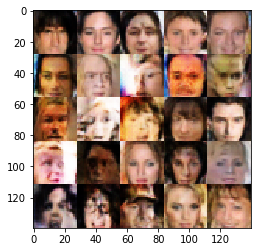

Epoch 2/3... Discriminator Loss: 1.4856... Generator Loss: 0.5811
Epoch 2/3... Discriminator Loss: 0.9858... Generator Loss: 0.8532
Epoch 2/3... Discriminator Loss: 1.5153... Generator Loss: 0.4303
Epoch 2/3... Discriminator Loss: 0.8840... Generator Loss: 0.8226
Epoch 2/3... Discriminator Loss: 1.0467... Generator Loss: 0.7598
Epoch 2/3... Discriminator Loss: 1.0220... Generator Loss: 1.0214
Epoch 2/3... Discriminator Loss: 1.0987... Generator Loss: 0.6039
Epoch 2/3... Discriminator Loss: 1.2719... Generator Loss: 0.5233
Epoch 2/3... Discriminator Loss: 1.1442... Generator Loss: 0.9595
Epoch 2/3... Discriminator Loss: 0.9382... Generator Loss: 0.6328


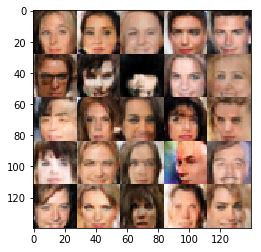

Epoch 2/3... Discriminator Loss: 1.2532... Generator Loss: 0.3983
Epoch 2/3... Discriminator Loss: 1.0143... Generator Loss: 0.6954
Epoch 2/3... Discriminator Loss: 0.9196... Generator Loss: 1.1289
Epoch 2/3... Discriminator Loss: 0.9520... Generator Loss: 0.9419
Epoch 2/3... Discriminator Loss: 1.1137... Generator Loss: 0.6060
Epoch 2/3... Discriminator Loss: 1.2224... Generator Loss: 0.5133
Epoch 2/3... Discriminator Loss: 0.7644... Generator Loss: 1.2769
Epoch 2/3... Discriminator Loss: 1.0412... Generator Loss: 0.8057
Epoch 2/3... Discriminator Loss: 1.6576... Generator Loss: 0.3200
Epoch 2/3... Discriminator Loss: 1.0771... Generator Loss: 1.0895


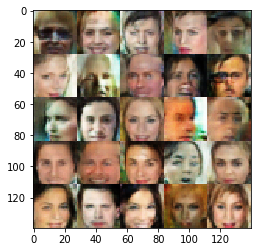

Epoch 2/3... Discriminator Loss: 1.3035... Generator Loss: 0.4778
Epoch 2/3... Discriminator Loss: 1.3061... Generator Loss: 0.7099
Epoch 2/3... Discriminator Loss: 1.0209... Generator Loss: 1.0785
Epoch 2/3... Discriminator Loss: 1.4524... Generator Loss: 0.5196
Epoch 2/3... Discriminator Loss: 0.8965... Generator Loss: 1.0542
Epoch 2/3... Discriminator Loss: 1.1465... Generator Loss: 0.6237
Epoch 2/3... Discriminator Loss: 1.2202... Generator Loss: 0.4232
Epoch 2/3... Discriminator Loss: 1.5802... Generator Loss: 0.4234
Epoch 2/3... Discriminator Loss: 1.0473... Generator Loss: 0.9935
Epoch 2/3... Discriminator Loss: 0.9347... Generator Loss: 1.5937


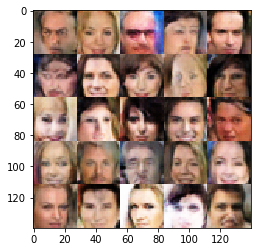

Epoch 2/3... Discriminator Loss: 0.8942... Generator Loss: 1.0554
Epoch 2/3... Discriminator Loss: 0.7744... Generator Loss: 0.9908
Epoch 2/3... Discriminator Loss: 1.9882... Generator Loss: 0.1717
Epoch 2/3... Discriminator Loss: 1.0916... Generator Loss: 0.6083
Epoch 2/3... Discriminator Loss: 1.4838... Generator Loss: 0.6217
Epoch 2/3... Discriminator Loss: 1.0470... Generator Loss: 0.6564
Epoch 2/3... Discriminator Loss: 1.3264... Generator Loss: 0.5035
Epoch 2/3... Discriminator Loss: 1.2511... Generator Loss: 0.8319
Epoch 2/3... Discriminator Loss: 1.0563... Generator Loss: 0.7445
Epoch 2/3... Discriminator Loss: 1.1604... Generator Loss: 0.5442


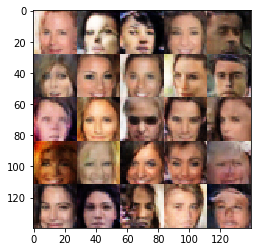

Epoch 2/3... Discriminator Loss: 1.0738... Generator Loss: 0.8270
Epoch 2/3... Discriminator Loss: 1.2380... Generator Loss: 0.9338
Epoch 2/3... Discriminator Loss: 0.9859... Generator Loss: 0.8117
Epoch 2/3... Discriminator Loss: 1.4445... Generator Loss: 0.3783
Epoch 2/3... Discriminator Loss: 1.0765... Generator Loss: 0.7881
Epoch 2/3... Discriminator Loss: 1.1551... Generator Loss: 0.3752
Epoch 2/3... Discriminator Loss: 1.2464... Generator Loss: 0.7343
Epoch 2/3... Discriminator Loss: 0.9538... Generator Loss: 0.9556
Epoch 2/3... Discriminator Loss: 1.4869... Generator Loss: 0.3499
Epoch 2/3... Discriminator Loss: 1.3456... Generator Loss: 0.3917


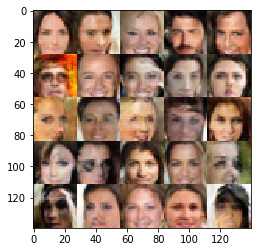

Epoch 2/3... Discriminator Loss: 1.0227... Generator Loss: 0.6883
Epoch 2/3... Discriminator Loss: 1.2549... Generator Loss: 0.6675
Epoch 2/3... Discriminator Loss: 1.2936... Generator Loss: 0.5240
Epoch 2/3... Discriminator Loss: 0.8234... Generator Loss: 1.1294
Epoch 2/3... Discriminator Loss: 1.0299... Generator Loss: 0.8624
Epoch 2/3... Discriminator Loss: 1.4920... Generator Loss: 0.2715
Epoch 2/3... Discriminator Loss: 0.8607... Generator Loss: 0.9060
Epoch 2/3... Discriminator Loss: 0.9048... Generator Loss: 0.6236
Epoch 2/3... Discriminator Loss: 1.4918... Generator Loss: 1.6446
Epoch 2/3... Discriminator Loss: 0.7429... Generator Loss: 1.5150


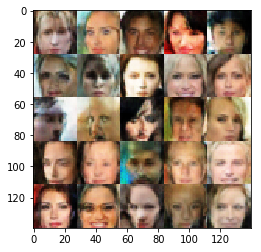

Epoch 2/3... Discriminator Loss: 0.9673... Generator Loss: 0.9007
Epoch 2/3... Discriminator Loss: 1.3716... Generator Loss: 0.3740
Epoch 2/3... Discriminator Loss: 1.0677... Generator Loss: 1.2186
Epoch 2/3... Discriminator Loss: 1.0196... Generator Loss: 0.9077
Epoch 2/3... Discriminator Loss: 1.1682... Generator Loss: 0.4696
Epoch 2/3... Discriminator Loss: 1.2897... Generator Loss: 0.4462
Epoch 2/3... Discriminator Loss: 1.2501... Generator Loss: 0.4280
Epoch 2/3... Discriminator Loss: 0.9070... Generator Loss: 0.9378
Epoch 2/3... Discriminator Loss: 1.5179... Generator Loss: 0.2676
Epoch 2/3... Discriminator Loss: 1.4644... Generator Loss: 0.4555


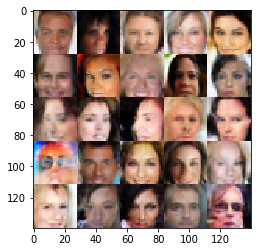

Epoch 2/3... Discriminator Loss: 0.9206... Generator Loss: 0.6729
Epoch 2/3... Discriminator Loss: 1.0972... Generator Loss: 0.5781
Epoch 2/3... Discriminator Loss: 0.9243... Generator Loss: 0.8550
Epoch 2/3... Discriminator Loss: 1.0797... Generator Loss: 0.5475
Epoch 2/3... Discriminator Loss: 1.4402... Generator Loss: 0.3758
Epoch 2/3... Discriminator Loss: 1.3369... Generator Loss: 0.3928
Epoch 2/3... Discriminator Loss: 0.9177... Generator Loss: 0.7547
Epoch 2/3... Discriminator Loss: 1.2310... Generator Loss: 0.4068
Epoch 2/3... Discriminator Loss: 0.9293... Generator Loss: 0.8630
Epoch 2/3... Discriminator Loss: 1.1594... Generator Loss: 0.6621


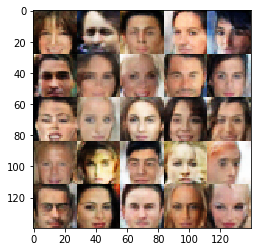

Epoch 2/3... Discriminator Loss: 1.2406... Generator Loss: 0.7380
Epoch 2/3... Discriminator Loss: 0.8848... Generator Loss: 1.1761
Epoch 2/3... Discriminator Loss: 1.2485... Generator Loss: 0.7301
Epoch 2/3... Discriminator Loss: 1.0992... Generator Loss: 1.3446
Epoch 2/3... Discriminator Loss: 1.2813... Generator Loss: 0.5129
Epoch 2/3... Discriminator Loss: 0.9827... Generator Loss: 0.6328
Epoch 2/3... Discriminator Loss: 1.1290... Generator Loss: 0.6851
Epoch 2/3... Discriminator Loss: 0.9265... Generator Loss: 0.8162
Epoch 2/3... Discriminator Loss: 1.1832... Generator Loss: 1.7722
Epoch 2/3... Discriminator Loss: 1.2573... Generator Loss: 0.5198


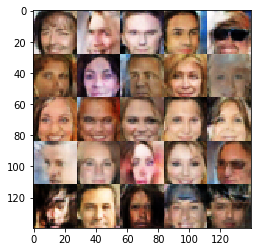

Epoch 2/3... Discriminator Loss: 1.2805... Generator Loss: 1.1935
Epoch 2/3... Discriminator Loss: 0.8375... Generator Loss: 1.2488
Epoch 2/3... Discriminator Loss: 1.2026... Generator Loss: 0.4742
Epoch 2/3... Discriminator Loss: 1.7082... Generator Loss: 0.4113
Epoch 2/3... Discriminator Loss: 0.8463... Generator Loss: 1.2765
Epoch 2/3... Discriminator Loss: 0.8627... Generator Loss: 0.9177
Epoch 2/3... Discriminator Loss: 0.9512... Generator Loss: 0.7437
Epoch 2/3... Discriminator Loss: 1.1975... Generator Loss: 0.9225
Epoch 2/3... Discriminator Loss: 0.9745... Generator Loss: 0.7581
Epoch 2/3... Discriminator Loss: 1.0464... Generator Loss: 0.8876


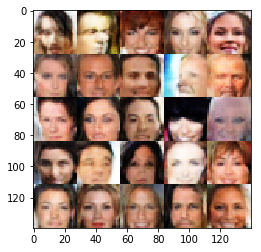

Epoch 2/3... Discriminator Loss: 1.0052... Generator Loss: 1.0546
Epoch 2/3... Discriminator Loss: 1.6334... Generator Loss: 0.3493
Epoch 2/3... Discriminator Loss: 1.3281... Generator Loss: 0.3748
Epoch 2/3... Discriminator Loss: 1.0200... Generator Loss: 0.5719
Epoch 2/3... Discriminator Loss: 0.8942... Generator Loss: 1.3825
Epoch 2/3... Discriminator Loss: 0.9072... Generator Loss: 0.9456
Epoch 2/3... Discriminator Loss: 1.1947... Generator Loss: 0.4854
Epoch 2/3... Discriminator Loss: 0.8998... Generator Loss: 0.9985
Epoch 2/3... Discriminator Loss: 0.8803... Generator Loss: 1.0702
Epoch 2/3... Discriminator Loss: 1.5718... Generator Loss: 0.5161


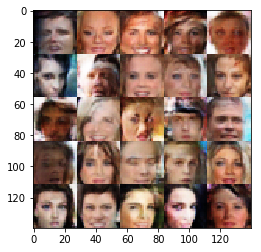

Epoch 2/3... Discriminator Loss: 1.0285... Generator Loss: 0.7142
Epoch 2/3... Discriminator Loss: 1.1213... Generator Loss: 0.5389
Epoch 2/3... Discriminator Loss: 1.2900... Generator Loss: 0.7788
Epoch 2/3... Discriminator Loss: 0.9040... Generator Loss: 1.2446
Epoch 2/3... Discriminator Loss: 0.8448... Generator Loss: 1.0614
Epoch 2/3... Discriminator Loss: 0.8911... Generator Loss: 1.1864
Epoch 2/3... Discriminator Loss: 1.1690... Generator Loss: 0.4770
Epoch 2/3... Discriminator Loss: 1.0725... Generator Loss: 0.5735
Epoch 2/3... Discriminator Loss: 1.1579... Generator Loss: 0.4812
Epoch 2/3... Discriminator Loss: 1.1659... Generator Loss: 0.7096


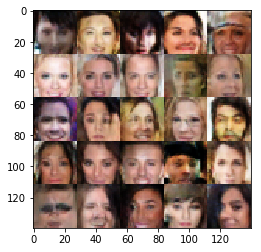

Epoch 2/3... Discriminator Loss: 1.1129... Generator Loss: 0.5953
Epoch 2/3... Discriminator Loss: 0.9589... Generator Loss: 1.0992
Epoch 2/3... Discriminator Loss: 1.0021... Generator Loss: 0.6641
Epoch 2/3... Discriminator Loss: 0.6349... Generator Loss: 1.7058
Epoch 2/3... Discriminator Loss: 1.0107... Generator Loss: 1.1769
Epoch 2/3... Discriminator Loss: 0.9539... Generator Loss: 0.9672
Epoch 2/3... Discriminator Loss: 1.1176... Generator Loss: 1.7958
Epoch 2/3... Discriminator Loss: 0.7341... Generator Loss: 1.2274
Epoch 2/3... Discriminator Loss: 1.3752... Generator Loss: 0.5959
Epoch 2/3... Discriminator Loss: 0.9825... Generator Loss: 0.6380


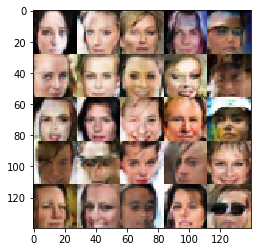

Epoch 2/3... Discriminator Loss: 1.4093... Generator Loss: 0.5594
Epoch 2/3... Discriminator Loss: 1.1343... Generator Loss: 0.6203
Epoch 2/3... Discriminator Loss: 0.7922... Generator Loss: 1.5133
Epoch 2/3... Discriminator Loss: 0.9414... Generator Loss: 0.8191
Epoch 2/3... Discriminator Loss: 0.9674... Generator Loss: 1.1678
Epoch 2/3... Discriminator Loss: 0.9644... Generator Loss: 0.7222
Epoch 2/3... Discriminator Loss: 1.4745... Generator Loss: 0.3087
Epoch 2/3... Discriminator Loss: 1.0521... Generator Loss: 0.6072
Epoch 2/3... Discriminator Loss: 1.3781... Generator Loss: 0.3928
Epoch 2/3... Discriminator Loss: 1.2175... Generator Loss: 0.4919


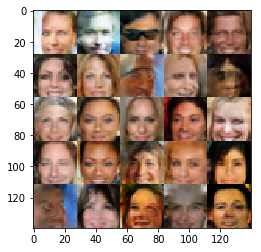

Epoch 2/3... Discriminator Loss: 1.2822... Generator Loss: 0.4528
Epoch 2/3... Discriminator Loss: 1.2431... Generator Loss: 1.6896
Epoch 2/3... Discriminator Loss: 1.1338... Generator Loss: 0.7094
Epoch 2/3... Discriminator Loss: 1.0001... Generator Loss: 0.6792
Epoch 2/3... Discriminator Loss: 0.8687... Generator Loss: 0.6916
Epoch 2/3... Discriminator Loss: 0.8999... Generator Loss: 0.6963
Epoch 2/3... Discriminator Loss: 0.8069... Generator Loss: 1.2572
Epoch 2/3... Discriminator Loss: 0.8477... Generator Loss: 1.1411
Epoch 2/3... Discriminator Loss: 1.4371... Generator Loss: 0.4235
Epoch 2/3... Discriminator Loss: 1.0551... Generator Loss: 0.5486


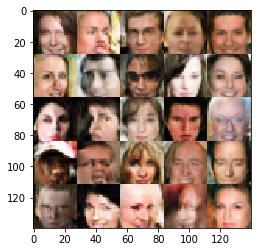

Epoch 2/3... Discriminator Loss: 0.9266... Generator Loss: 0.7186
Epoch 2/3... Discriminator Loss: 0.8572... Generator Loss: 1.9341
Epoch 2/3... Discriminator Loss: 0.8987... Generator Loss: 1.9312
Epoch 2/3... Discriminator Loss: 1.0358... Generator Loss: 1.0623
Epoch 2/3... Discriminator Loss: 1.1865... Generator Loss: 0.7036
Epoch 2/3... Discriminator Loss: 1.3244... Generator Loss: 0.4882
Epoch 2/3... Discriminator Loss: 1.0454... Generator Loss: 0.7178
Epoch 2/3... Discriminator Loss: 1.0994... Generator Loss: 0.8382
Epoch 2/3... Discriminator Loss: 1.5407... Generator Loss: 0.3704
Epoch 2/3... Discriminator Loss: 1.6356... Generator Loss: 0.3606


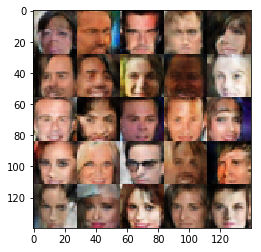

Epoch 2/3... Discriminator Loss: 1.3179... Generator Loss: 0.7472
Epoch 2/3... Discriminator Loss: 1.4347... Generator Loss: 0.4229
Epoch 2/3... Discriminator Loss: 0.8929... Generator Loss: 0.7218
Epoch 2/3... Discriminator Loss: 0.8914... Generator Loss: 1.3279
Epoch 2/3... Discriminator Loss: 0.9718... Generator Loss: 0.9458
Epoch 2/3... Discriminator Loss: 1.3111... Generator Loss: 0.3734
Epoch 2/3... Discriminator Loss: 1.4330... Generator Loss: 0.4531
Epoch 2/3... Discriminator Loss: 0.9826... Generator Loss: 1.4213
Epoch 2/3... Discriminator Loss: 1.1309... Generator Loss: 0.5313
Epoch 2/3... Discriminator Loss: 0.8802... Generator Loss: 1.1329


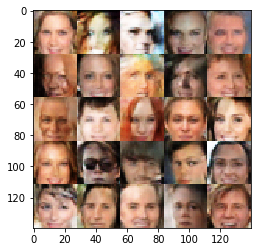

Epoch 2/3... Discriminator Loss: 1.0450... Generator Loss: 0.6325
Epoch 2/3... Discriminator Loss: 0.9708... Generator Loss: 0.6288
Epoch 2/3... Discriminator Loss: 1.0486... Generator Loss: 0.8116
Epoch 2/3... Discriminator Loss: 1.4831... Generator Loss: 0.2371
Epoch 2/3... Discriminator Loss: 1.3605... Generator Loss: 0.5796
Epoch 2/3... Discriminator Loss: 0.6946... Generator Loss: 1.1532
Epoch 2/3... Discriminator Loss: 0.9258... Generator Loss: 1.1042
Epoch 2/3... Discriminator Loss: 1.2927... Generator Loss: 0.5460
Epoch 2/3... Discriminator Loss: 0.6924... Generator Loss: 1.1388
Epoch 2/3... Discriminator Loss: 0.7123... Generator Loss: 1.2864


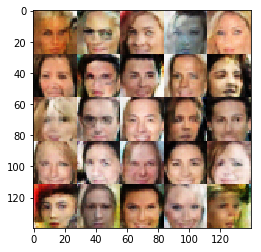

Epoch 2/3... Discriminator Loss: 1.3710... Generator Loss: 0.4960
Epoch 2/3... Discriminator Loss: 1.3414... Generator Loss: 0.6082
Epoch 2/3... Discriminator Loss: 1.2527... Generator Loss: 0.6576
Epoch 2/3... Discriminator Loss: 0.7353... Generator Loss: 1.0957
Epoch 2/3... Discriminator Loss: 1.3588... Generator Loss: 0.4212
Epoch 2/3... Discriminator Loss: 0.8934... Generator Loss: 0.8296
Epoch 2/3... Discriminator Loss: 0.8123... Generator Loss: 1.4685
Epoch 2/3... Discriminator Loss: 1.1914... Generator Loss: 0.5963
Epoch 2/3... Discriminator Loss: 1.1491... Generator Loss: 1.1521
Epoch 2/3... Discriminator Loss: 1.6570... Generator Loss: 0.4095


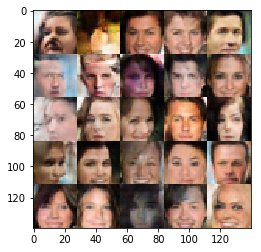

Epoch 2/3... Discriminator Loss: 0.9871... Generator Loss: 0.6729
Epoch 2/3... Discriminator Loss: 1.1604... Generator Loss: 0.4031
Epoch 2/3... Discriminator Loss: 0.9554... Generator Loss: 1.0584
Epoch 2/3... Discriminator Loss: 0.7696... Generator Loss: 0.9981
Epoch 2/3... Discriminator Loss: 1.0310... Generator Loss: 1.3416
Epoch 2/3... Discriminator Loss: 1.2688... Generator Loss: 0.3514
Epoch 2/3... Discriminator Loss: 0.6552... Generator Loss: 1.0339
Epoch 2/3... Discriminator Loss: 1.5327... Generator Loss: 0.3153
Epoch 2/3... Discriminator Loss: 0.8742... Generator Loss: 1.1376
Epoch 2/3... Discriminator Loss: 1.1552... Generator Loss: 0.8756


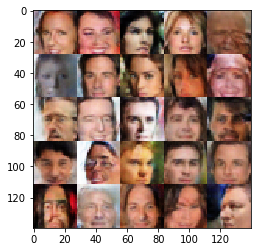

Epoch 2/3... Discriminator Loss: 0.9581... Generator Loss: 0.7754
Epoch 2/3... Discriminator Loss: 1.1659... Generator Loss: 0.5894
Epoch 2/3... Discriminator Loss: 0.8635... Generator Loss: 1.0714
Epoch 2/3... Discriminator Loss: 1.1398... Generator Loss: 0.5699
Epoch 2/3... Discriminator Loss: 1.3766... Generator Loss: 0.4082
Epoch 2/3... Discriminator Loss: 0.8563... Generator Loss: 1.0370
Epoch 2/3... Discriminator Loss: 1.4851... Generator Loss: 0.2794
Epoch 2/3... Discriminator Loss: 0.9076... Generator Loss: 0.9187
Epoch 2/3... Discriminator Loss: 0.7645... Generator Loss: 1.1214
Epoch 2/3... Discriminator Loss: 0.8078... Generator Loss: 1.0389


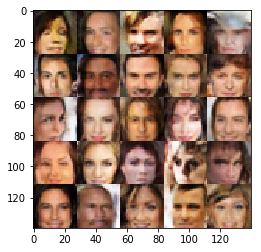

Epoch 2/3... Discriminator Loss: 1.1614... Generator Loss: 0.6914
Epoch 2/3... Discriminator Loss: 1.1094... Generator Loss: 1.3900
Epoch 2/3... Discriminator Loss: 1.0802... Generator Loss: 0.6217
Epoch 2/3... Discriminator Loss: 0.6878... Generator Loss: 1.1672
Epoch 2/3... Discriminator Loss: 1.2809... Generator Loss: 0.4778
Epoch 2/3... Discriminator Loss: 1.0892... Generator Loss: 0.6130
Epoch 2/3... Discriminator Loss: 0.8020... Generator Loss: 1.1629
Epoch 2/3... Discriminator Loss: 0.8652... Generator Loss: 1.3893
Epoch 2/3... Discriminator Loss: 0.8403... Generator Loss: 1.2585
Epoch 2/3... Discriminator Loss: 0.9508... Generator Loss: 0.7864


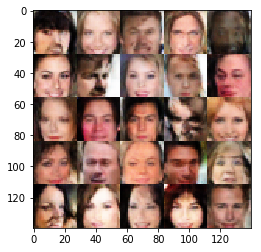

Epoch 2/3... Discriminator Loss: 0.8608... Generator Loss: 1.0988
Epoch 2/3... Discriminator Loss: 0.8574... Generator Loss: 1.9732
Epoch 2/3... Discriminator Loss: 0.7529... Generator Loss: 1.2296
Epoch 2/3... Discriminator Loss: 0.8663... Generator Loss: 1.3012
Epoch 2/3... Discriminator Loss: 0.9958... Generator Loss: 0.7070
Epoch 2/3... Discriminator Loss: 1.6466... Generator Loss: 0.2627
Epoch 2/3... Discriminator Loss: 1.1748... Generator Loss: 0.5211
Epoch 2/3... Discriminator Loss: 0.8288... Generator Loss: 1.3394
Epoch 2/3... Discriminator Loss: 0.9004... Generator Loss: 1.2696
Epoch 2/3... Discriminator Loss: 1.1828... Generator Loss: 0.7487


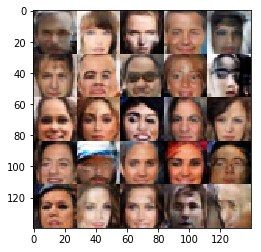

Epoch 2/3... Discriminator Loss: 0.8806... Generator Loss: 0.6908
Epoch 2/3... Discriminator Loss: 1.3470... Generator Loss: 0.3485
Epoch 2/3... Discriminator Loss: 1.0635... Generator Loss: 0.5456
Epoch 2/3... Discriminator Loss: 0.8997... Generator Loss: 0.8432
Epoch 2/3... Discriminator Loss: 0.7423... Generator Loss: 0.9389
Epoch 2/3... Discriminator Loss: 1.5518... Generator Loss: 0.4444
Epoch 2/3... Discriminator Loss: 1.1232... Generator Loss: 0.6591
Epoch 2/3... Discriminator Loss: 1.0300... Generator Loss: 0.4881
Epoch 2/3... Discriminator Loss: 1.2920... Generator Loss: 0.4184
Epoch 2/3... Discriminator Loss: 1.3675... Generator Loss: 0.6928


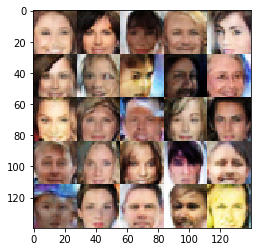

Epoch 2/3... Discriminator Loss: 0.8409... Generator Loss: 0.8558
Epoch 2/3... Discriminator Loss: 0.9783... Generator Loss: 0.6667
Epoch 2/3... Discriminator Loss: 1.0349... Generator Loss: 0.7332
Epoch 2/3... Discriminator Loss: 0.9424... Generator Loss: 0.7904
Epoch 2/3... Discriminator Loss: 0.7859... Generator Loss: 1.0858
Epoch 2/3... Discriminator Loss: 0.6627... Generator Loss: 1.8175
Epoch 2/3... Discriminator Loss: 0.9026... Generator Loss: 1.8025
Epoch 2/3... Discriminator Loss: 0.6430... Generator Loss: 1.4099
Epoch 2/3... Discriminator Loss: 1.2500... Generator Loss: 0.5811
Epoch 2/3... Discriminator Loss: 1.0728... Generator Loss: 0.6310


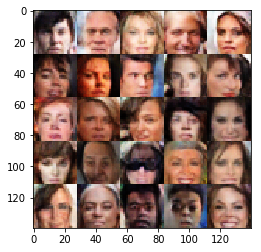

Epoch 2/3... Discriminator Loss: 1.6802... Generator Loss: 0.4198
Epoch 2/3... Discriminator Loss: 1.1102... Generator Loss: 0.8371
Epoch 2/3... Discriminator Loss: 1.2753... Generator Loss: 0.3746
Epoch 2/3... Discriminator Loss: 1.2035... Generator Loss: 0.7255
Epoch 2/3... Discriminator Loss: 1.0058... Generator Loss: 1.6354
Epoch 2/3... Discriminator Loss: 1.5531... Generator Loss: 0.2974
Epoch 2/3... Discriminator Loss: 0.6150... Generator Loss: 1.7309
Epoch 2/3... Discriminator Loss: 1.5147... Generator Loss: 0.4838
Epoch 2/3... Discriminator Loss: 1.0415... Generator Loss: 1.0944
Epoch 2/3... Discriminator Loss: 0.9403... Generator Loss: 0.6392


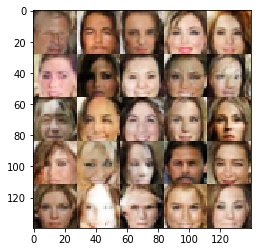

Epoch 2/3... Discriminator Loss: 1.1517... Generator Loss: 0.7011
Epoch 2/3... Discriminator Loss: 0.8349... Generator Loss: 1.0239
Epoch 2/3... Discriminator Loss: 0.9182... Generator Loss: 0.8566
Epoch 2/3... Discriminator Loss: 0.8800... Generator Loss: 1.0801
Epoch 2/3... Discriminator Loss: 1.0531... Generator Loss: 0.9757
Epoch 2/3... Discriminator Loss: 1.2291... Generator Loss: 0.5403
Epoch 2/3... Discriminator Loss: 1.0191... Generator Loss: 0.7610
Epoch 2/3... Discriminator Loss: 0.9205... Generator Loss: 1.1244
Epoch 2/3... Discriminator Loss: 1.1670... Generator Loss: 0.4636
Epoch 2/3... Discriminator Loss: 1.0854... Generator Loss: 0.6538


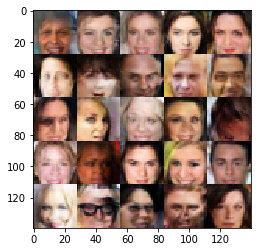

Epoch 2/3... Discriminator Loss: 0.7710... Generator Loss: 1.1827
Epoch 2/3... Discriminator Loss: 0.9073... Generator Loss: 0.6788
Epoch 2/3... Discriminator Loss: 1.1090... Generator Loss: 1.2040
Epoch 2/3... Discriminator Loss: 1.1601... Generator Loss: 0.5505
Epoch 2/3... Discriminator Loss: 1.1688... Generator Loss: 0.6738
Epoch 2/3... Discriminator Loss: 0.8701... Generator Loss: 0.8638
Epoch 2/3... Discriminator Loss: 1.3848... Generator Loss: 0.3398
Epoch 2/3... Discriminator Loss: 0.7519... Generator Loss: 1.3723
Epoch 2/3... Discriminator Loss: 1.0183... Generator Loss: 0.5016
Epoch 2/3... Discriminator Loss: 1.1131... Generator Loss: 0.6566


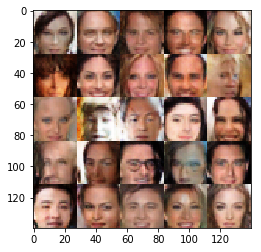

Epoch 2/3... Discriminator Loss: 0.7423... Generator Loss: 0.9521
Epoch 2/3... Discriminator Loss: 0.8392... Generator Loss: 1.5371
Epoch 2/3... Discriminator Loss: 0.9656... Generator Loss: 1.2164
Epoch 2/3... Discriminator Loss: 1.4189... Generator Loss: 0.3639
Epoch 2/3... Discriminator Loss: 0.9770... Generator Loss: 0.8979
Epoch 2/3... Discriminator Loss: 0.9047... Generator Loss: 0.8320
Epoch 2/3... Discriminator Loss: 0.9462... Generator Loss: 0.8422
Epoch 2/3... Discriminator Loss: 0.8993... Generator Loss: 1.1895
Epoch 2/3... Discriminator Loss: 0.8892... Generator Loss: 0.9173
Epoch 2/3... Discriminator Loss: 1.0038... Generator Loss: 1.1805


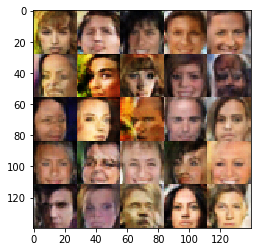

Epoch 2/3... Discriminator Loss: 1.4243... Generator Loss: 0.4124
Epoch 2/3... Discriminator Loss: 1.0983... Generator Loss: 0.6623
Epoch 2/3... Discriminator Loss: 1.0491... Generator Loss: 1.4413
Epoch 2/3... Discriminator Loss: 0.7343... Generator Loss: 1.2054
Epoch 2/3... Discriminator Loss: 0.7134... Generator Loss: 1.2907
Epoch 2/3... Discriminator Loss: 0.7791... Generator Loss: 1.5707
Epoch 2/3... Discriminator Loss: 0.7626... Generator Loss: 1.8549
Epoch 2/3... Discriminator Loss: 0.8786... Generator Loss: 1.1097
Epoch 2/3... Discriminator Loss: 1.6005... Generator Loss: 0.3660
Epoch 2/3... Discriminator Loss: 1.1868... Generator Loss: 0.6469


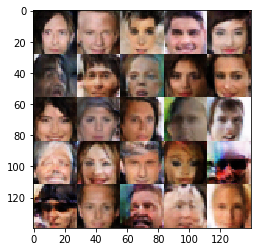

Epoch 2/3... Discriminator Loss: 0.9178... Generator Loss: 0.5553
Epoch 2/3... Discriminator Loss: 0.9900... Generator Loss: 0.8807
Epoch 2/3... Discriminator Loss: 0.9531... Generator Loss: 0.9548
Epoch 2/3... Discriminator Loss: 1.0268... Generator Loss: 0.5904
Epoch 2/3... Discriminator Loss: 1.7675... Generator Loss: 0.3610
Epoch 2/3... Discriminator Loss: 0.7822... Generator Loss: 1.4646
Epoch 2/3... Discriminator Loss: 1.4836... Generator Loss: 0.4253
Epoch 2/3... Discriminator Loss: 1.9125... Generator Loss: 0.2813
Epoch 2/3... Discriminator Loss: 1.1828... Generator Loss: 0.6486
Epoch 2/3... Discriminator Loss: 1.5362... Generator Loss: 0.3954


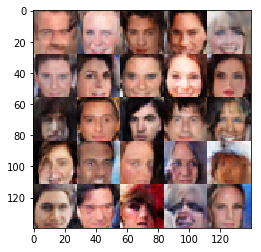

Epoch 2/3... Discriminator Loss: 1.0378... Generator Loss: 1.2163
Epoch 2/3... Discriminator Loss: 0.9479... Generator Loss: 0.9699
Epoch 2/3... Discriminator Loss: 1.4891... Generator Loss: 0.3467
Epoch 2/3... Discriminator Loss: 1.1570... Generator Loss: 0.4691
Epoch 2/3... Discriminator Loss: 1.0076... Generator Loss: 0.6083
Epoch 2/3... Discriminator Loss: 0.8451... Generator Loss: 0.8846
Epoch 2/3... Discriminator Loss: 1.2265... Generator Loss: 0.7641
Epoch 2/3... Discriminator Loss: 0.8124... Generator Loss: 1.2364
Epoch 2/3... Discriminator Loss: 0.9465... Generator Loss: 1.1121
Epoch 2/3... Discriminator Loss: 1.3380... Generator Loss: 0.4847


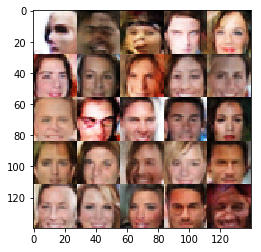

Epoch 2/3... Discriminator Loss: 0.8697... Generator Loss: 0.7994
Epoch 2/3... Discriminator Loss: 1.1605... Generator Loss: 0.5996
Epoch 2/3... Discriminator Loss: 0.6699... Generator Loss: 1.0808
Epoch 2/3... Discriminator Loss: 1.1469... Generator Loss: 0.9357
Epoch 2/3... Discriminator Loss: 0.8000... Generator Loss: 0.9452
Epoch 2/3... Discriminator Loss: 1.1130... Generator Loss: 0.5318


KeyboardInterrupt: 

In [54]:
batch_size = 32
z_dim = 128
learning_rate = .0004
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.